# WebClassifier

In [1]:
__author__ = 'BPar'

import logging
import numpy as np
#from optparse import OptionParser
import sys
from time import time

import pickle
import os
# This is necesary because of a problem with my local ENVIRONMENT
os.environ['LC_ALL'] = 'en_US.UTF-8'
os.environ['LANG'] = 'en_US.UTF-8'

import pylab as pl #this line must be after the "environ" hack

import matplotlib.pyplot as plt

from sklearn.datasets import fetch_20newsgroups
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import HashingVectorizer
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.linear_model import RidgeClassifier
from sklearn.svm import LinearSVC
from sklearn.linear_model import SGDClassifier
from sklearn.linear_model import Perceptron
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.naive_bayes import BernoulliNB, MultinomialNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import NearestCentroid
from sklearn.utils.extmath import density
from sklearn import metrics
from sklearn.metrics import make_scorer, roc_auc_score, roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.ensemble import RandomForestClassifier
# from nltk.stem import *
from sklearn import cross_validation
from sklearn.grid_search import GridSearchCV
from sklearn.metrics import classification_report
from collections import Counter

# from pymongo import MongoClient

from collections import namedtuple
plt.ion()
%matplotlib inline

# 1. Read the data

### Options for the project

In [2]:
#opts = namedtuple("opts", "report chi2_select confusion_matrix top10 use_hashing n_features")
opts = namedtuple("opts", "print_report select_chi2 print_cm print_top10 use_hashing n_features force_read_mongo min_len_documentation")

In [3]:
opts.print_report = True
opts.select_chi2 = 50000
opts.print_cm = True #confussion matrix
opts.print_top10 = True
opts.use_hashing = False
opts.n_features = 50000
opts.force_read_mongo = False #True
opts.min_len_documentation = 100

### Creating Data Train and Data test nametuple

In [4]:
data_train = namedtuple("data_train", "data target target_names") #data is a list of all the texts , #target is an array with the category
data_test = namedtuple("data_test", "data target target_names") #data is a list of all the texts , #target is an array with the category
mycategories = np.array([])

### Read Data from file

In [5]:
# If the data is into files. Use it.
with open("data_train_data",'rb') as f:
    data_train.data=pickle.load(f)
with open("data_train_target",'rb') as f:
    data_train.target=pickle.load(f)
with open("data_train_target_names",'rb') as f:
    data_train.target_names=pickle.load(f)
with open("data_categories",'rb') as f:
    mycategories=pickle.load(f)

### TEST Data
with open("data_test_data",'rb') as f:
    data_test.data=pickle.load(f)
with open("data_test_target",'rb') as f:
    data_test.target=pickle.load(f)
with open("data_test_target_names",'rb') as f:
    data_test.target_names=pickle.load(f) 


# Statistics from the corpus. Data Exploration

## 1. Some statistics about the amount of Documents

In [6]:
categories = mycategories
#data_train = mydata_train
#data_test = mydata_test
def size_mb(docs):
    return sum(len(s.encode('utf-8')) for s in docs) / 1e6

data_train_size_mb = size_mb(data_train.data)
data_test_size_mb = size_mb(data_test.data)
data_all_size_mb = size_mb(data_train.data+data_test.data)

print("%d documents - %0.3fMB (training set)" % (
    len(data_train.data), data_train_size_mb))
print("%d documents - %0.3fMB (test set)" % (
    len(data_test.data), data_test_size_mb))

print("%d documents - %0.3fMB (all corpus)" % (
    len(data_train.data+data_test.data), data_all_size_mb))

print("%d categories" % len(mycategories))

print("Percentage of Test vs Total: %f" % ( 
        float(len(data_test.data)) / len(data_train.data+data_test.data)*100)) + '%'


100746 documents - 325.876MB (training set)
25231 documents - 80.133MB (test set)
125977 documents - 406.009MB (all corpus)
23 categories
Percentage of Test vs Total: 20.028259%


#### Let's see what are the categories in the Corpus

In [7]:
print(mycategories)

[u'arts-and-entertainment', u'automotive', u'business', u'careers', u'education', u'family-and-parenting', u'food-and-drink', u'health-and-fitness', u'hobbies-and-interests', u'home-and-garden', u'law-government-and-politics', u'news', u'personal-finance', u'pets', u'real-estate', u'religion-and-spirituality', u'science', u'shopping', u'society', u'sports', u'style-and-fashion', u'technology-and-computing', u'travel']


In [8]:
#mycategories[19]

## Are dataTrain and dataTest equivalent in terms of frequency  of each category and amount of data?

### Calculating the amount of Documents in each category for data_train and data_test

In [9]:
# Let's count the amount of documents in data_train and in data_test.
categories_amount_train = Counter(data_train.target)
# now counting the amount of documents for each category
total_amount_docu_train = np.sum(categories_amount_train.values())
# the same for test
categories_amount_test = Counter(data_test.target)
total_amount_docu_test = np.sum(categories_amount_test.values())

In [10]:
# Calculating the percentage of documents in each category
train_per = map(lambda x: (x[0], float(x[1])/total_amount_docu_train*100), \
                categories_amount_train.items())
test_per = map(lambda x: (x[0], float(x[1])/total_amount_docu_test*100),
               categories_amount_test.items())

### Calculate difference between the frequency of each category for data_train and data_test

In [11]:
# using comprehension list to zip the name of each category with the difference between
# train_per and test_per (i.e the percentage of each category for the test data and train data)
difference_categories_train_test = [(mycategories[a_i[0]], # using mycategories to do the conversion between class number and name
                                     np.absolute(a_i[1] - b_i[1])) for a_i, b_i in zip(train_per, test_per)]
print difference_categories_train_test

[(u'arts-and-entertainment', 0.010009904606345543), (u'automotive', 0.076261535617040188), (u'business', 0.028930703054062867), (u'careers', 0.0045742153019658893), (u'education', 0.0034800433945276765), (u'family-and-parenting', 0.030059809152484629), (u'food-and-drink', 0.0011013318429773378), (u'health-and-fitness', 0.015208804613962457), (u'hobbies-and-interests', 0.026749597855335594), (u'home-and-garden', 0.10111681909827164), (u'law-government-and-politics', 0.046699302644230389), (u'news', 0.0088737959336053773), (u'personal-finance', 0.054811430929616822), (u'pets', 0.065525212275900468), (u'real-estate', 0.0030933675351023648), (u'religion-and-spirituality', 0.0091888330973337595), (u'science', 0.0084327911127526356), (u'shopping', 0.025853032300720447), (u'society', 0.02139778208156029), (u'sports', 0.13863114399507559), (u'style-and-fashion', 0.035413001836941183), (u'technology-and-computing', 0.055883296884029932), (u'travel', 0.0023685617528189096)]


### Which categories has more than 0.1% of difference in the frequency?

In [12]:
# Whe are interesting in those categories with the biggest difference. 
filter(lambda x: x[1]>0.1, difference_categories_train_test)

[(u'home-and-garden', 0.10111681909827164), (u'sports', 0.13863114399507559)]

#### There are almost no diferences between the amount of documents in data_train and data_test

## 2. Some statistics about the texts inside the Documents

### Samples of two elements in the dataset. Sport and Travel categories.

In [197]:
print('_' * 80)
print "Category: %s" % data_train.target_names[0]
print "Text Crawled: " + data_train.data[0]
print "Length in tokens: %d" % len(data_train.data[0].split())
print('_' * 80)
i=0
while (data_train.target_names[i] != "travel") or (len(data_train.data[i].split()) < 100):
    i += 1
print "Category: %s " % data_train.target_names[i]
print "Text Crawled: " + data_train.data[i]
print "Length in tokens: %d" % len(data_train.data[i].split())
print('_' * 80)

________________________________________________________________________________
Category: sports
Text Crawled: This newsletter is sent every morning at 6 a.m. and includes the morning's top stories, a full list of obituaries, links to comics and puzzles and the most recent news, sports and entertainment headlines.  Check here if you do not want to receive additional email offers and information. 
Length in tokens: 48
________________________________________________________________________________
Category: travel 
Text Crawled: As announced earlier this year, the New Zealand government has proceeded to enforce a reduction in the tobacco allowance for inbound travellers.  The new regulations were implemented as of November 1.  Inbound travellers will now have to pay GST and duty on tobacco exceeding the allowance of 50 cigarettes, which has been reduced from 200, or 50 grams of cigars or tobacco.  The gift concession for tobacco has also been removed, where previously parcels received 

### Tokens inside the Documents

In [198]:
# obtain a list containing the length of each documents in terms of words (using str.split we get words)
l_corpus = map(len, map(str.split,map(str,data_train.data+data_test.data)))

In [199]:
def dataInsights(l):
    maxLenDoc = max(l)
    minLenDoc = min(l)
    aveLenDoc = np.average(np.array(l)) 
    medianDoc = np.median(np.array(l))
    stdDoc = np.std(np.array(l))
    return maxLenDoc, minLenDoc, aveLenDoc, medianDoc, stdDoc
    
statDocs = dataInsights(l_corpus)
print "Len in 'tokens' of each Document: Max %s, Min %s, Mean: %s, Mediam: %s, Std: %s" % (statDocs[0], statDocs[1], 
                                                                     statDocs[2], statDocs[3], 
                                                                     statDocs[4])

Len in 'tokens' of each Document: Max 82567, Min 8, Mean: 519.575882899, Mediam: 174.0, Std: 1462.39068745


In [200]:
l_corpus2 = filter(lambda x: x<100, l_corpus)
print len(l_corpus), len(l_corpus2)

125977 46446


### Number of Documents of each type

In [201]:
# we are studing all the corpus, then => data_test + data_train
categories_amount = Counter(data_test.target + data_train.target)

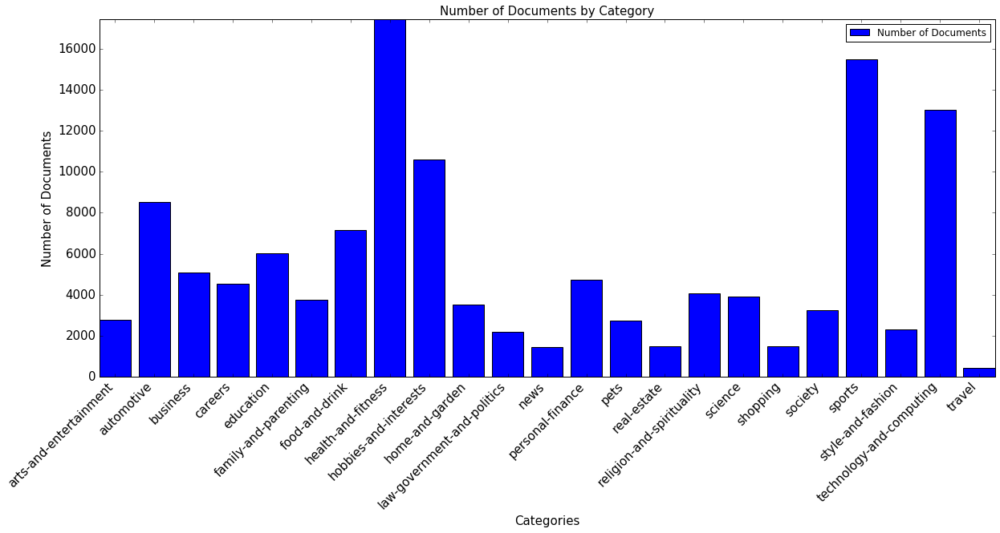

In [202]:
fig = plt.figure(1, [20, 8])
plt.bar(range(len(categories_amount)), categories_amount.values(), align='center', label="Number of Documents")
plt.xticks(range(len(categories_amount)), map(lambda x: mycategories[x], categories_amount.keys()), rotation=45, ha='right')
plt.autoscale(tight=True)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.legend(loc='best')
ax = fig.add_subplot(111)
ax.set_title('Number of Documents by Category', fontsize= 15)
ax.set_xlabel('Categories', fontsize=15)
ax.set_ylabel('Number of Documents', fontsize=15)
plt.show()

#### Draw a plot with the amount of Documents in those 12 categories with less documents.

In [203]:
catThreshold = dict(map(lambda y: (mycategories[y[0]],y[1]), filter(lambda x: x[1] < 4000, categories_amount.items())))

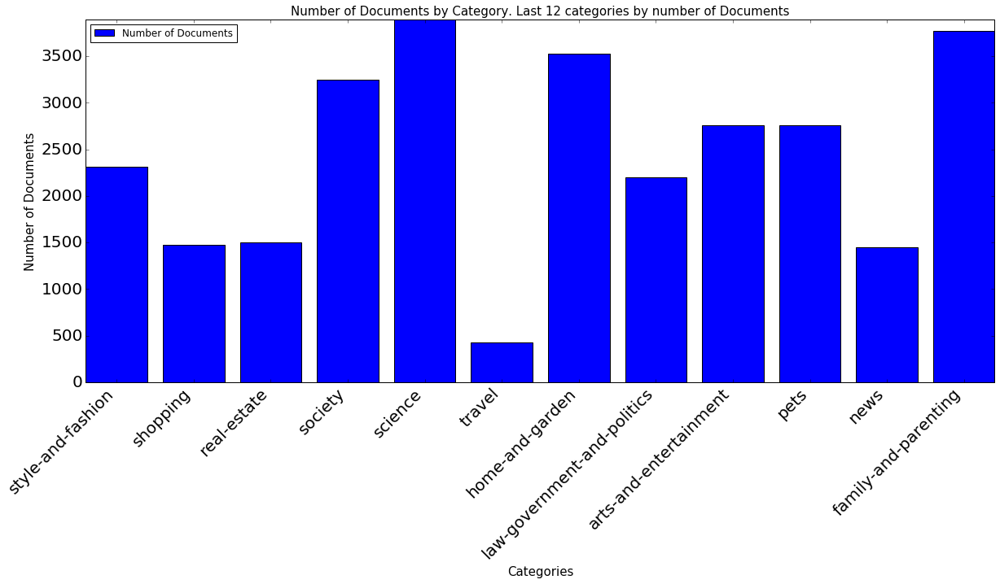

In [204]:
fig = plt.figure(1, [20, 8])
plt.bar(range(len(catThreshold)), catThreshold.values(), align='center', label="Number of Documents")
plt.xticks(range(len(catThreshold)), catThreshold.keys(), rotation=45, ha='right')
plt.tick_params(axis='both', which='major', labelsize=20)
plt.legend(loc='best')
#plt.setp(ax.get_xticklabels(), rotation=30, horizontalalignment='right')
plt.autoscale(tight=True)
ax = fig.add_subplot(111)
ax.set_title('Number of Documents by Category. Last 12 categories by number of Documents', fontsize= 15)
ax.set_xlabel('Categories', fontsize=15)
ax.set_ylabel('Number of Documents', fontsize=15)
plt.show()

### Some statistics insights about the Documents inside each category

In [205]:
def catInsights(cat):
    maxCat = max(cat.items(), key=lambda x: x[1])
    minCat = min(cat.items(), key=lambda x: x[1])
    # Calculate the average using numpy is easier than reduce
    aveCat = np.average(np.array(cat.values())) #reduce(lambda x, y: x + y, l) / len(l)
    medianCat = np.median(np.array(cat.values()))
    stdCat = np.std(np.array(cat.values()))
    return maxCat, minCat, aveCat, medianCat, stdCat
    
statDocs = catInsights(categories_amount)
print "Statistics: Max %s, Min %s, Mean: %s, Median: %s, Std: %s" % ((mycategories[statDocs[0][0]], statDocs[0][1]), 
                                                                     (mycategories[statDocs[1][0]], statDocs[1][1]), 
                                                                     statDocs[2], statDocs[3], 
                                                                     statDocs[4])

Statistics: Max (u'health-and-fitness', 17450), Min (u'travel', 432), Mean: 5477.26086957, Median: 3898.0, Std: 4499.14565047


### What is the quality of the text inside each document?. Let's see how many numbers are in each category.

##### First, we get the digits in each Document for each catagory

In [206]:
# getting all the digits inside train and test data
dataTrDigits = map(lambda y: [int(s) for s in y.split() if s.isdigit()], data_train.data)
dataTstDigits = map(lambda y: [int(s) for s in y.split() if s.isdigit()], data_test.data)
# Calculating the len of each document without the digits
dataTrDigitLen = map(lambda x: len(x),dataTrDigits)
dataTstDigitLen = map(lambda x: len(x),dataTstDigits)
# zip each document with the category. To be able to count by category.
numbersZipCatTr = zip(data_train.target,dataTrDigitLen)
numbersZipCatTst = zip(data_train.target,dataTstDigitLen)
numbersZipCat = numbersZipCatTr + numbersZipCatTst
# Count By category
c = Counter()
for k, v1 in numbersZipCat:
    c[k] += v1
print c


Counter({7: 78521, 19: 54170, 21: 39975, 1: 28019, 8: 25832, 4: 24477, 6: 22160, 10: 17777, 5: 14698, 15: 13894, 18: 12229, 16: 11693, 0: 10165, 2: 9636, 12: 9254, 9: 8120, 13: 7846, 3: 6571, 11: 3881, 20: 3590, 14: 2897, 17: 2598, 22: 1112})


In [207]:
statDocs = catInsights(c)
print "Statistics: Max %s, Min %s, Mean: %s, Mediam: %s, Std: %s" % ((mycategories[statDocs[0][0]], statDocs[0][1]), 
                                                                     (mycategories[statDocs[1][0]], statDocs[1][1]), 
                                                                     statDocs[2], statDocs[3], 
                                                                     statDocs[4])

Statistics: Max (u'health-and-fitness', 78521), Min (u'travel', 1112), Mean: 17787.6086957, Mediam: 11693.0, Std: 18023.5274011


##### Plotting the number of digits found for each category

By doing this we can see in a glance if a category with has a lot of digits vs tokens (ahead)

In [208]:
catNumDig = dict(map(lambda y: (mycategories[y[0]],y[1]), c.items()))

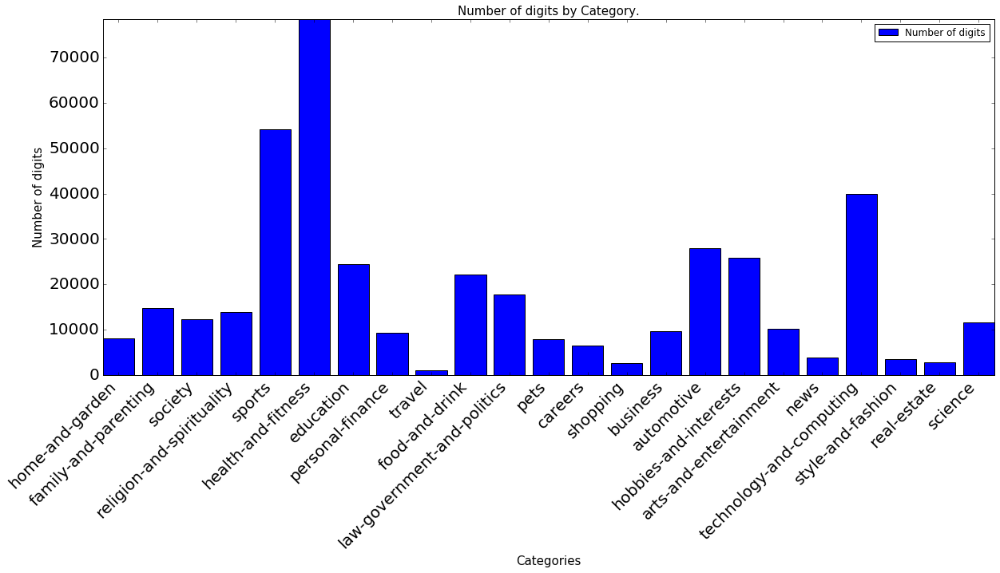

In [209]:

fig = plt.figure(1, [20, 8])
plt.bar(range(len(catNumDig)), catNumDig.values(), align='center', label="Number of digits")
plt.xticks(range(len(catNumDig)), catNumDig.keys(), rotation=45, ha='right')
plt.tick_params(axis='both', which='major', labelsize=20)
plt.autoscale(tight=True)
ax = fig.add_subplot(111)
ax.set_title('Number of digits by Category.', fontsize= 15)
ax.set_xlabel('Categories', fontsize=15)
ax.set_ylabel('Number of digits', fontsize=15)
plt.legend(loc='best')
plt.show()

### Amount of tokens inside each document in each category

In [210]:
#This code is very similar then the previous. First calculate the len of each Documents in terms of tokens
dataTrAllLen = map(len, map(str.split,map(str,data_train.data))) 
dataTstAllLen = map(len, map(str.split,map(str,data_test.data))) 
# zip the result with the numeric label of each category
numbersZipCatAllTr = zip(data_train.target,dataTrAllLen)
numbersZipCatAllTst = zip(data_train.target,dataTstAllLen)
# we are interested in all the corpus
numbersZipCatAll = numbersZipCatAllTr + numbersZipCatAllTst
c = Counter()
for k, v1 in numbersZipCatAll:
    c[k] += v1
print c

Counter({7: 11174158, 21: 6971765, 19: 6088385, 8: 4803341, 15: 4409740, 4: 3849826, 6: 3624810, 1: 3288497, 5: 2724507, 10: 2720472, 18: 2477161, 16: 2092323, 12: 1926697, 2: 1873858, 0: 1373975, 3: 1363401, 13: 1357550, 9: 1213367, 20: 701761, 14: 493239, 17: 433756, 11: 353486, 22: 138536})


In [211]:
catNumDocAll = dict(map(lambda y: (mycategories[y[0]],y[1]), c.items()))

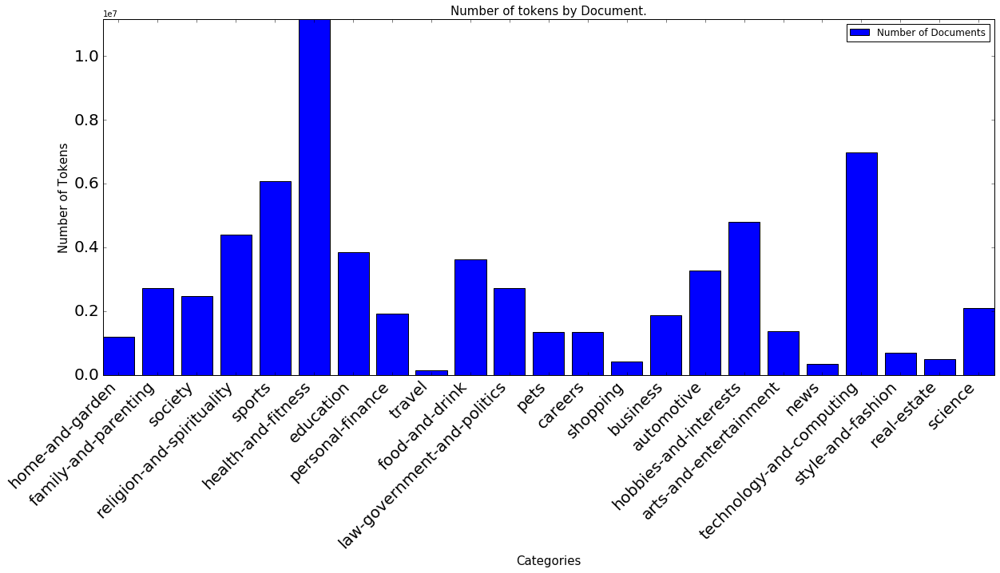

In [212]:
fig = plt.figure(1, [20, 8])
plt.bar(range(len(catNumDocAll)), catNumDocAll.values(), align='center', label="Number of Documents")
plt.xticks(range(len(catNumDig)), catNumDocAll.keys(), rotation=45, ha='right')
plt.tick_params(axis='both', which='major', labelsize=20)
plt.autoscale(tight=True)
ax = fig.add_subplot(111)
ax.set_title('Number of tokens by Document.', fontsize= 15)
ax.set_xlabel('Categories', fontsize=15)
ax.set_ylabel('Number of Tokens', fontsize=15)
plt.legend(loc='best')
plt.show()

##### Statistics calculated over the amount of tokens in each category (nothing filtered)

In [213]:
statDocs = catInsights(c)
print "Statistics: Max %s, Min %s, Mean: %s, Mediam: %s, Std: %s" % ((mycategories[statDocs[0][0]], statDocs[0][1]), 
                                                                     (mycategories[statDocs[1][0]], statDocs[1][1]), 
                                                                     statDocs[2], statDocs[3], 
                                                                     statDocs[4])

Statistics: Max (u'health-and-fitness', 11174158), Min (u'travel', 138536), Mean: 2845852.65217, Mediam: 2092323.0, Std: 2521607.0311


# Vectorization, Reduce features and Benchmark

### Split de train data y test data

In [14]:
y_train, y_test = data_train.target, data_test.target

### Vectorization

In [15]:
print("Extracting features from the training dataset using a sparse vectorizer")
t0 = time()
print("Using TF-IDF Vectorized")
# Creating a vectorizer. with Stop_words in english and token_pattern ignoring digits
vectorizer = TfidfVectorizer(sublinear_tf=True,     # Apply sublinear tf scaling
                             min_df=1,              # No ignoring tokens with low frequency
                             max_df=0.5,            # ignoring token with 50% of frequency
                             stop_words='english',  # StopWords in english
                             lowercase=True,        # convert all to lowercase
                             token_pattern= r'[a-zA-Z]+') # ignore no words
# Learning the vocabulary dictionary and returning term-document matrix with fit_transform
X_train = vectorizer.fit_transform(data_train.data)
duration = time() - t0
print("done in %fs at %0.3fMB/s" % (duration, data_train_size_mb / duration))
print("n_samples: %d, n_features: %d" % X_train.shape)


Extracting features from the training dataset using a sparse vectorizer
Using TF-IDF Vectorized
done in 38.805136s at 8.398MB/s
n_samples: 100746, n_features: 312646


#### Print some info about the performance

In [16]:
print("Extracting features from the test dataset using the same vectorizer")
t0 = time()
# for test we need to learn a vocabulary dictionary of all tokens in the raw documents
X_test = vectorizer.transform(data_test.data)
duration = time() - t0
print("done in %fs at %0.3fMB/s" % (duration, data_test_size_mb / duration))
print("n_samples: %d, n_features: %d" % X_test.shape)

Extracting features from the test dataset using the same vectorizer
done in 8.986617s at 8.917MB/s
n_samples: 25231, n_features: 312646


### Reducing the amount of features with Chi2

In [17]:
if opts.select_chi2:
    print("Extracting %d best features by a chi-squared test" %
          opts.select_chi2)
    t0 = time()
    # Selecting the K best features
    ch2 = SelectKBest(chi2, k=opts.select_chi2)
    # creating X_train and X_test in term of that features selected
    X_train = ch2.fit_transform(X_train, y_train)
    X_test = ch2.transform(X_test)
    print("done in %fs" % (time() - t0))


Extracting 50000 best features by a chi-squared test
done in 1.699296s


### Benchmark function that will do the train and print some figures

In [18]:
def benchmark(clf, X_train, y_train, X_test, y_test, title=""):
    print('_' * 80)
    print("Training: ")
    print(clf)
    
    t0 = time()
    # training the classifier with the algorithm "clf"
    clf.fit(X_train, y_train)
    train_time = time() - t0
    print("train time: %0.3fs" % train_time)

    t0 = time()
    # Using the classifier to classify the Test data. Time to test is needed for the final score
    pred = clf.predict(X_test)
    test_time = time() - t0
    print("test time:  %0.3fs" % test_time)
    
    # calculating the precision, recall, f1-score for the classification predicted
    score = metrics.accuracy_score(y_test, pred)
    print("accuracy:   %0.3f" % score)

    if hasattr(clf, 'coef_'):
        print("dimensionality: %d" % clf.coef_.shape[1])
        print("density: %f" % density(clf.coef_))

    clf_descr = str(clf).split('(')[0]    

    # Printing the report
    if opts.print_report:
        print("classification report:")
        print(metrics.classification_report(y_test, pred, target_names=categories))
    
    # printing the Confusion Matrix
    if opts.print_cm:
        fontSize = 16
        print("confusion matrix:")
        # calculate the congusion matrix
        cm = metrics.confusion_matrix(y_test, pred)
        # normalize the confusion matrix (we need percentages!)
        cm1 = cm / cm.astype(np.float).sum(axis=1)
        fig, ax = plt.subplots(figsize=(20,20))
        im = ax.imshow(cm1)
        fig.colorbar(im, label = "% of documents clasified")
        fig.suptitle('Confusion Matrix for %s' % clf, fontsize=fontSize)
        
        # Set the major ticks at the centers and minor tick at the edges
        locs = np.arange(len(categories))
        for axis in [ax.xaxis, ax.yaxis]:
            axis.set_ticks(locs + 0.5, minor=True)
            axis.set(ticks=locs, ticklabels=categories)
            
        # Turn on the grid for the minor ticksw23
        ax.grid(True, which='minor')
        plt.setp(ax.get_xticklabels(), fontsize=fontSize, rotation='vertical', )
        #fig.savefig('%s.jpg' % title)
        
    return clf_descr, score, test_time, cm 

In [19]:
results = []

# Previous Study about the algorithms

## Train Classifiers: Naive Bayes, LinearSVC, RandomForest

##### This previous study gives us a general idea about the behaviour of each algorithm. After this "study" a stratifieldKfold will be executed. Using the averages the Final Score will be calculated

### Naive Bayes classifier

Naive Bayes
________________________________________________________________________________
Training: 
MultinomialNB(alpha=0.01, class_prior=None, fit_prior=True)
train time: 0.672s
test time:  0.168s
accuracy:   0.771
dimensionality: 50000
density: 1.000000
classification report:
                             precision    recall  f1-score   support

     arts-and-entertainment       0.69      0.57      0.62       555
                 automotive       0.87      0.85      0.86      1725
                   business       0.68      0.64      0.66      1013
                    careers       0.72      0.72      0.72       906
                  education       0.64      0.74      0.69      1204
       family-and-parenting       0.76      0.72      0.74       749
             food-and-drink       0.80      0.81      0.81      1433
         health-and-fitness       0.85      0.84      0.85      3498
      hobbies-and-interests       0.66      0.74      0.70      2119
            home-and-garde

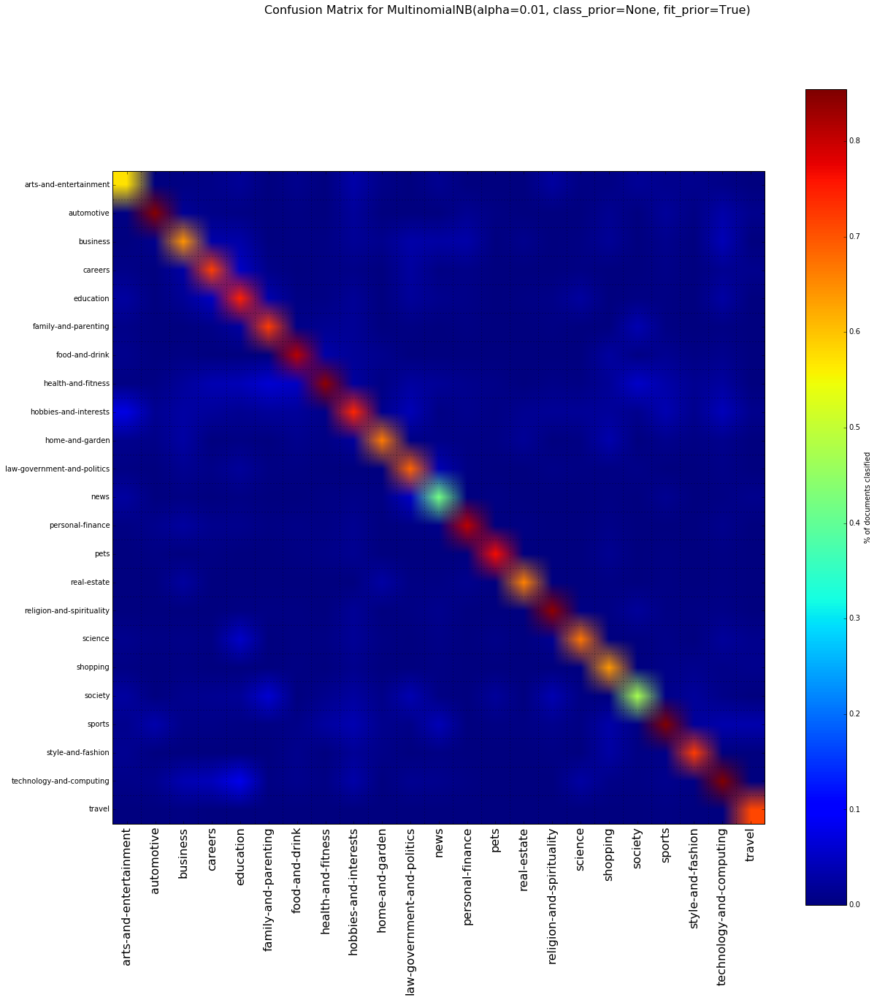

In [220]:
print('=' * 80)
print("Naive Bayes")
results.append(benchmark(MultinomialNB(alpha=.01),X_train, y_train, X_test, y_test, "Naive Bayes_MultinomialNB"))

### LinearSVC Classifier

L1 penalty
________________________________________________________________________________
Training: 
LinearSVC(C=1, class_weight=None, dual=False, fit_intercept=True,
     intercept_scaling=1, loss='squared_hinge', max_iter=1000,
     multi_class='ovr', penalty='l1', random_state=None, tol=0.01,
     verbose=0)
train time: 84.651s
test time:  0.178s
accuracy:   0.836
dimensionality: 50000
density: 0.045487
classification report:
                             precision    recall  f1-score   support

     arts-and-entertainment       0.73      0.66      0.69       555
                 automotive       0.92      0.89      0.91      1725
                   business       0.77      0.77      0.77      1013
                    careers       0.83      0.79      0.81       906
                  education       0.79      0.79      0.79      1204
       family-and-parenting       0.83      0.79      0.81       749
             food-and-drink       0.89      0.86      0.88      1433
         hea

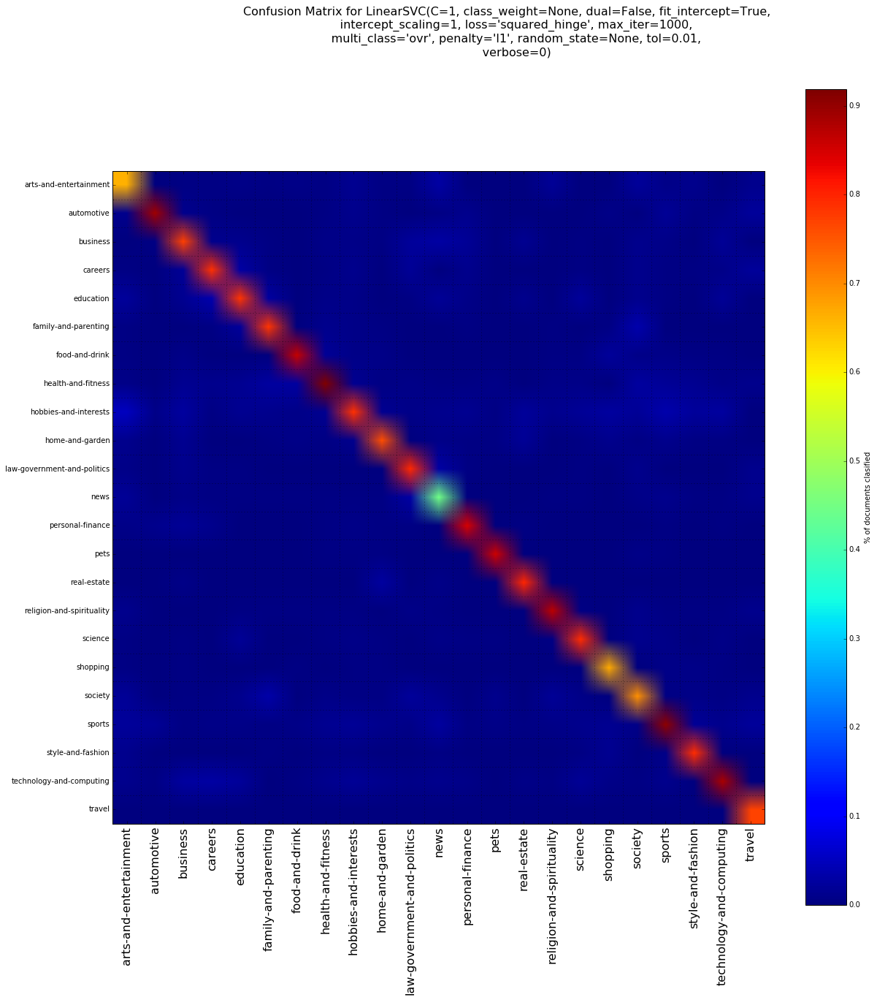

In [221]:
print('=' * 80)
print("%s penalty" % 'l1'.upper())
# Train Liblinear model
title="LinearSVC Liblinear model"
results.append(benchmark(LinearSVC(C=1 , loss='squared_hinge', penalty='l1', max_iter=1000, 
                                   dual=False, tol=1e-2),X_train, y_train, X_test, y_test, title+"_penalty_"+'l1'))

In [222]:
#print('=' * 80)
# KNN
#title="kNN"
#results.append(benchmark(KNeighborsClassifier(n_neighbors=10, n_jobs=4), title))

### Random Forest Classifier 

________________________________________________________________________________
Training: 
RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=40, n_jobs=4,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)
train time: 247.040s
test time:  0.623s
accuracy:   0.791
classification report:
                             precision    recall  f1-score   support

     arts-and-entertainment       0.74      0.50      0.60       555
                 automotive       0.86      0.89      0.88      1725
                   business       0.71      0.60      0.65      1013
                    careers       0.79      0.71      0.75       906
                  education       0.71      0.77      0.74      1204
       family-and-parenting       0.77      0.70      0

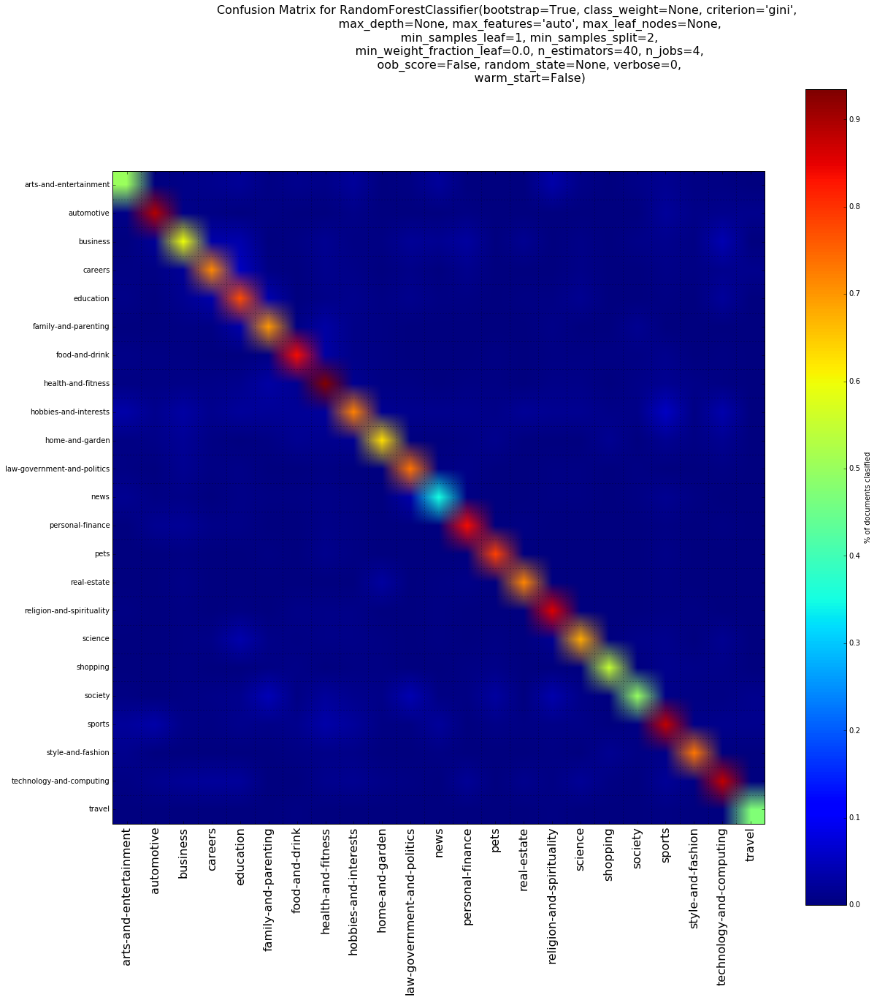

In [ ]:
print('=' * 80)
title="Random Forest"
results.append(benchmark(RandomForestClassifier(n_estimators=40, n_jobs=4),X_train, y_train, X_test, y_test, title))
#max_features=5000, verbose=1,n_jobs=-1), dense=False))

### Refinement of LinearSVC using GridSearch

In [20]:
tuned_parameters = [{'C': [1, 10, 1000], 'penalty': ['l1'], 'dual': [False]},
                    {'C': [1, 10, 1000], 'penalty': ['l2']}]

scores = ['f1_macro', 'f1_weighted', 'f1_micro']

for score in scores:
    print("# Tuning hyper-parameters for %s" % score)
    print()
    # using gridSearch to get the best cnfiguration for LinearSVC
    clf = GridSearchCV(LinearSVC(C=1), tuned_parameters, cv=5,
                       scoring=score)
    clf.fit(X_train, y_train)

    print("Best parameters set found on development set:")
    print()
    print(clf.best_params_)
    print()
    print("Grid scores on development set:")
    print()
    for params, mean_score, scores in clf.grid_scores_:
        print("%0.3f (+/-%0.03f) for %r"
              % (mean_score, scores.std() * 2, params))
    print()

    print("Detailed classification report:")
    print()
    print("The model is trained on the full development set.")
    print("The scores are computed on the full evaluation set.")
    print()
    y_true, y_pred = y_test, clf.predict(X_test)
    print(classification_report(y_true, y_pred))
    print()

# Tuning hyper-parameters for f1_macro
()
Best parameters set found on development set:
()
{'penalty': 'l2', 'C': 1}
()
Grid scores on development set:
()
0.766 (+/-0.061) for {'penalty': 'l1', 'C': 1, 'dual': False}
0.738 (+/-0.067) for {'penalty': 'l1', 'C': 10, 'dual': False}
0.729 (+/-0.069) for {'penalty': 'l1', 'C': 1000, 'dual': False}
0.774 (+/-0.058) for {'penalty': 'l2', 'C': 1}
0.748 (+/-0.068) for {'penalty': 'l2', 'C': 10}
0.719 (+/-0.069) for {'penalty': 'l2', 'C': 1000}
()
Detailed classification report:
()
The model is trained on the full development set.
The scores are computed on the full evaluation set.
()
             precision    recall  f1-score   support

          0       0.77      0.70      0.73       555
          1       0.92      0.89      0.91      1725
          2       0.79      0.78      0.78      1013
          3       0.82      0.79      0.80       906
          4       0.80      0.78      0.79      1204
          5       0.84      0.79      0.81      

##### Let's see the behaviour of LinearSVC with the new hyperparameters

L2 penalty
________________________________________________________________________________
Training: 
LinearSVC(C=1, class_weight=None, dual=False, fit_intercept=True,
     intercept_scaling=1, loss='squared_hinge', max_iter=1000,
     multi_class='ovr', penalty='l2', random_state=None, tol=0.01,
     verbose=0)
train time: 51.662s
test time:  0.116s
accuracy:   0.842
dimensionality: 50000
density: 1.000000
classification report:
                             precision    recall  f1-score   support

     arts-and-entertainment       0.75      0.68      0.72       555
                 automotive       0.94      0.89      0.91      1725
                   business       0.79      0.78      0.79      1013
                    careers       0.82      0.79      0.81       906
                  education       0.80      0.78      0.79      1204
       family-and-parenting       0.83      0.79      0.81       749
             food-and-drink       0.89      0.87      0.88      1433
         hea

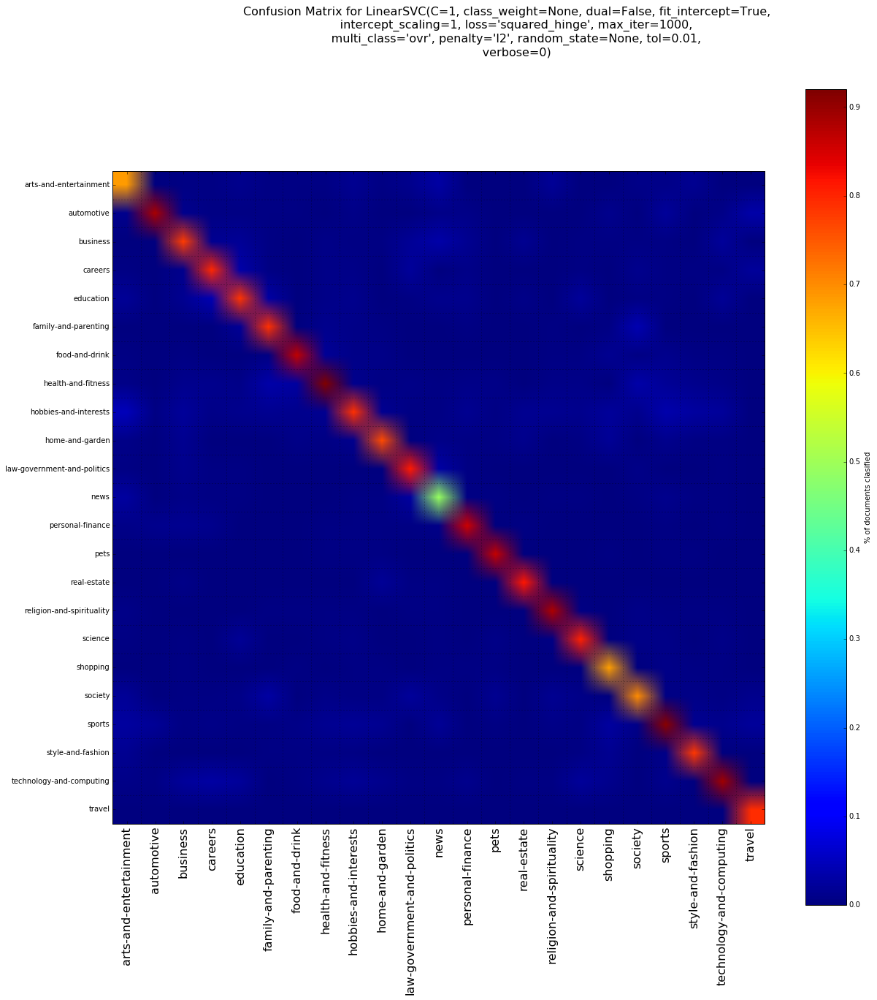

In [21]:
print('=' * 80)
print("%s penalty" % 'l2'.upper())
# Train Liblinear model
title="LinearSVC Liblinear model"
results.append(benchmark(LinearSVC(C=1 , loss='squared_hinge', penalty='l2', max_iter=1000, 
                                   dual=False, tol=1e-2),X_train, y_train, X_test, y_test, title+"_penalty_"+'l1'))

# KFlod Stratified for : LinearSVC, Naive Bayes and RF

In [22]:
# We need all the data (no previously splitted) to be able to creat the folds
def load_all_data():
    mydata_train = namedtuple("mydata", "data target target_names")
    if (os.path.isfile("data_train_all_data")):
        with open("data_train_all_data",'rb') as f:
            mydata_train.data=pickle.load(f)
        with open("data_train_all_target",'rb') as f:
            mydata_train.target=pickle.load(f)
        with open("data_train_all_target_names",'rb') as f:
            mydata_train.target_names=pickle.load(f)
    return mydata_train

In [23]:
mydata = namedtuple("mydata", "data target target_names")
mydata = load_all_data()

In [24]:
# defining the folds.
kf = cross_validation.StratifiedKFold(mydata.target, n_folds = 10, random_state=0)

In [25]:
def KFS_Execution(kf, data, labels, vectorizer, clf):
    NB = []
    for train_index, test_index in kf:
        t0 = time()
        print len(train_index), len(test_index)
        #Split the corpus
        X_train, X_test = data[train_index], data[test_index]
        y_train, y_test = labels[train_index], labels[test_index]

        # For Test
        # let's see if there is the same amount (percentage) of documents in each category inside train and test
        #print np.array(np.array(Counter(y_train).values()) / float(len(y_train))) - \
        #      np.array(np.array(Counter(y_test).values()) / float(len(y_test)))

        # Train
        X_train = vectorizer.fit_transform(X_train)
        # Vectorizing
        X_test = vectorizer.transform(X_test)
        # Extracting the features
        print("Extracting %d best features by a chi-squared test" % opts.select_chi2)
        t0 = time()
        ch2 = SelectKBest(chi2, k=opts.select_chi2)
        X_train = ch2.fit_transform(X_train, y_train)
        X_test = ch2.transform(X_test)
        print("done in %fs" % (time() - t0))
        # Add the results to be returned
        NB.append(benchmark(clf, \
                            X_train, \
                            y_train, \
                            X_test, \
                            y_test, \
                            clf))

        train_time = time() - t0
        print("Fold time: %0.3fs" % train_time)
    return NB
    
        

### LinearSVC execution (l2, C=1)

129370 14387
Extracting 50000 best features by a chi-squared test
done in 1.335727s
________________________________________________________________________________
Training: 
LinearSVC(C=1.0, class_weight=None, dual=False, fit_intercept=True,
     intercept_scaling=1, loss='squared_hinge', max_iter=1000,
     multi_class='ovr', penalty='l2', random_state=None, tol=0.001,
     verbose=0)
train time: 149.672s
test time:  0.034s
accuracy:   0.711
dimensionality: 50000
density: 1.000000
classification report:
                             precision    recall  f1-score   support

     arts-and-entertainment       0.76      0.67      0.72       326
                 automotive       0.83      0.73      0.78       994
                   business       0.57      0.47      0.51       571
                    careers       0.74      0.71      0.73       507
                  education       0.74      0.74      0.74       654
       family-and-parenting       0.81      0.74      0.77       411
    

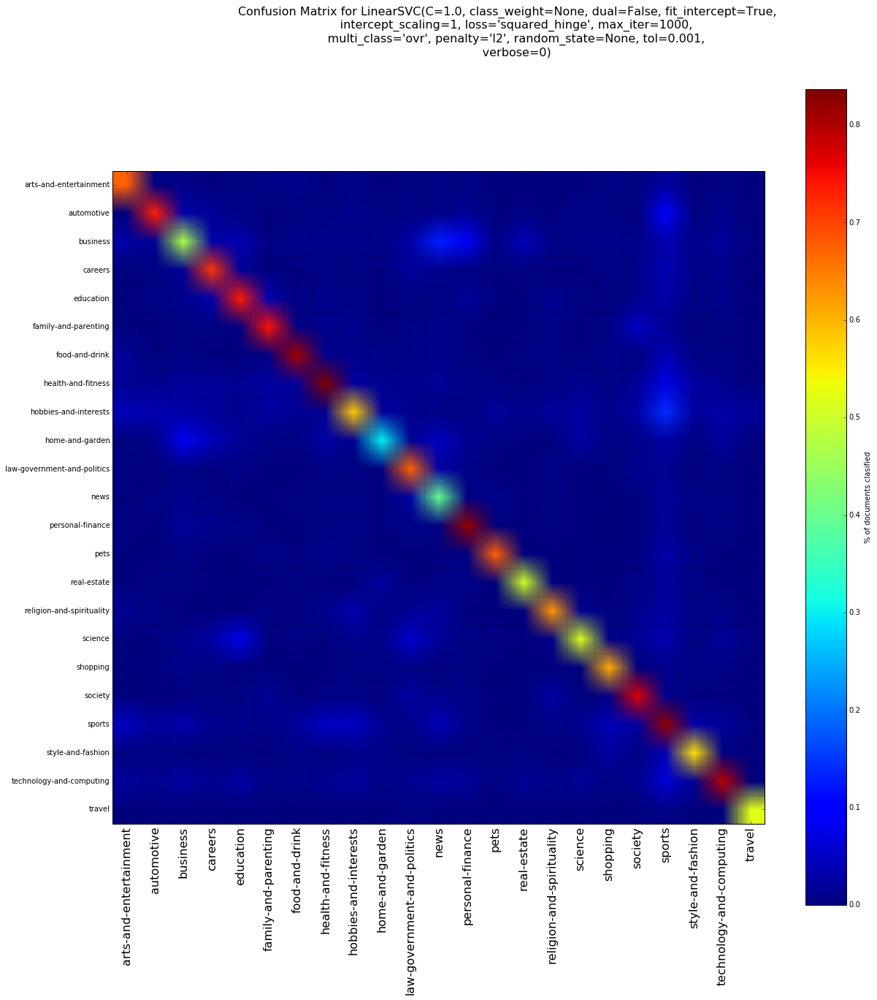

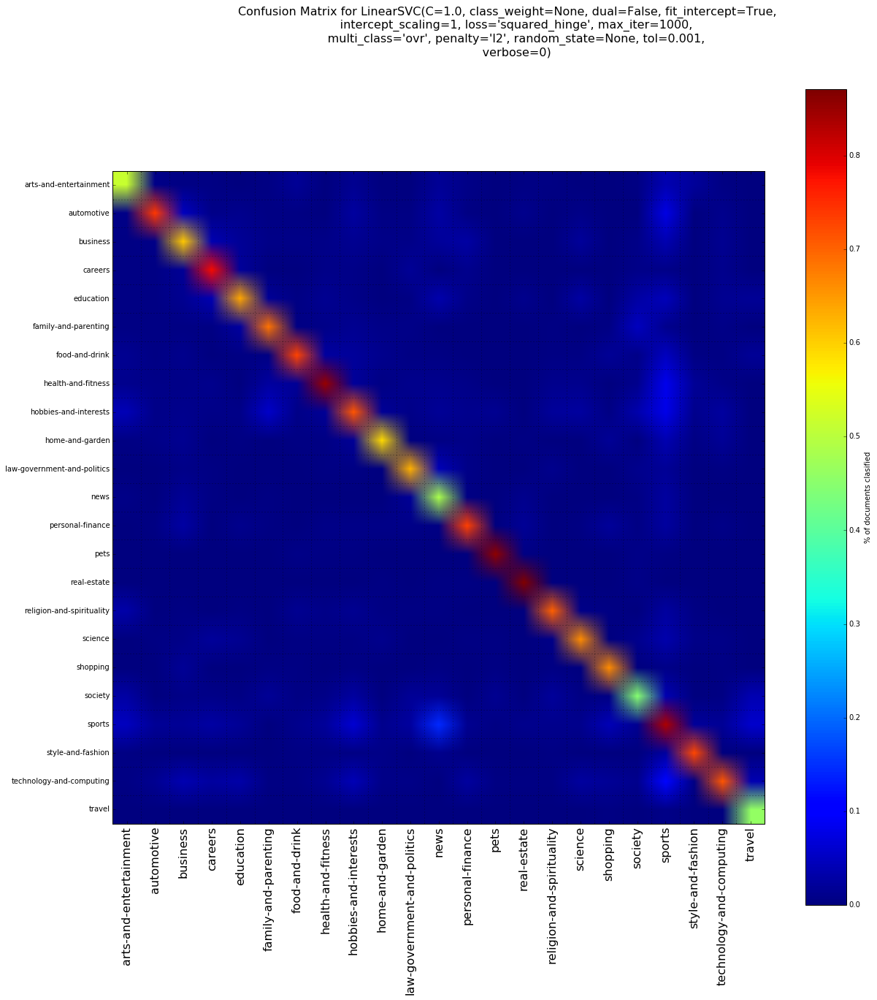

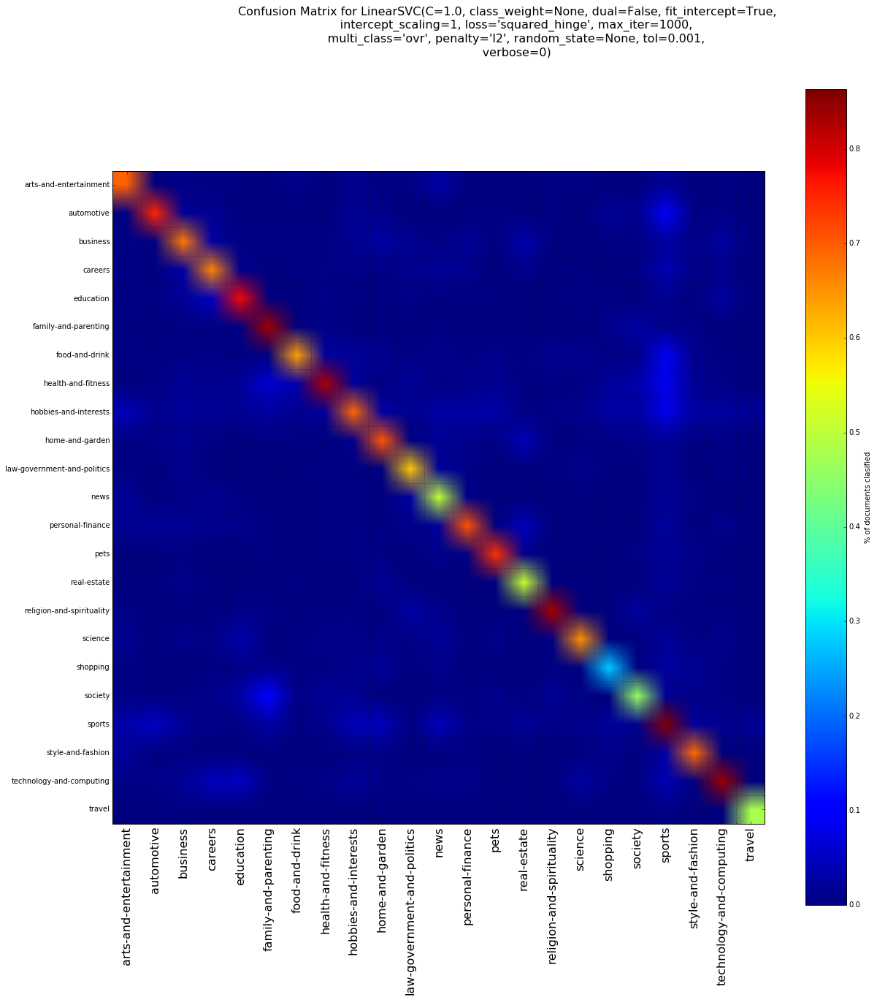

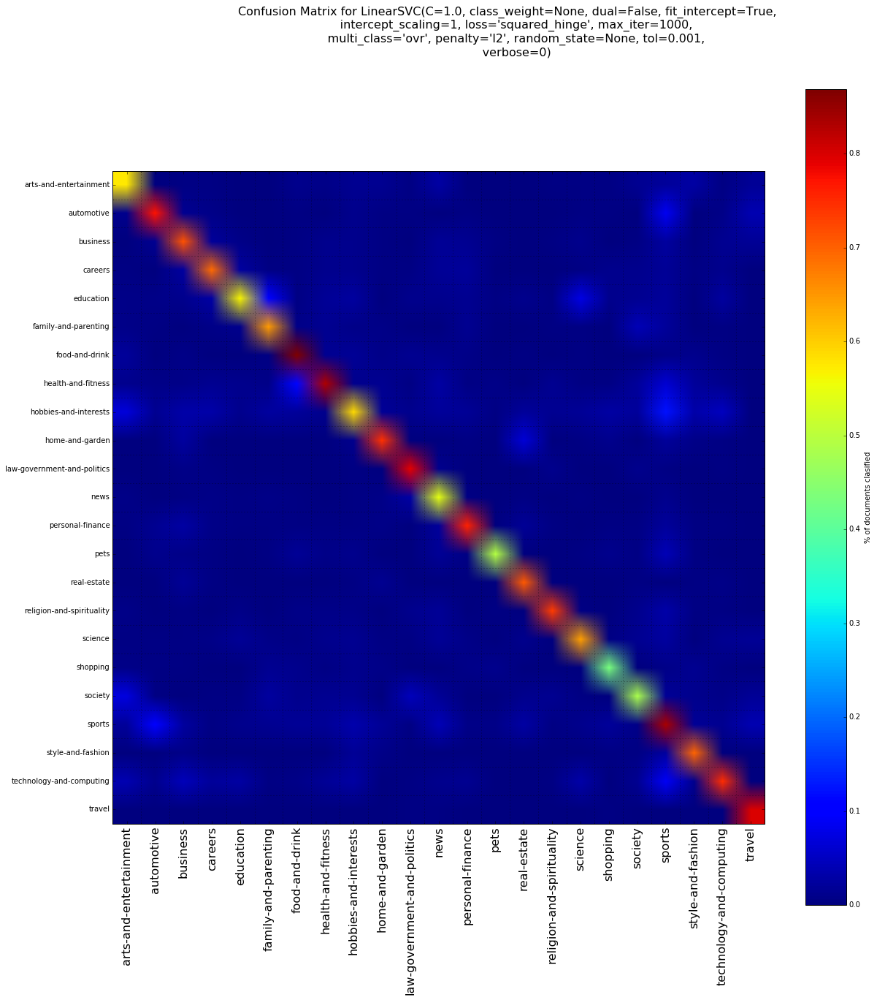

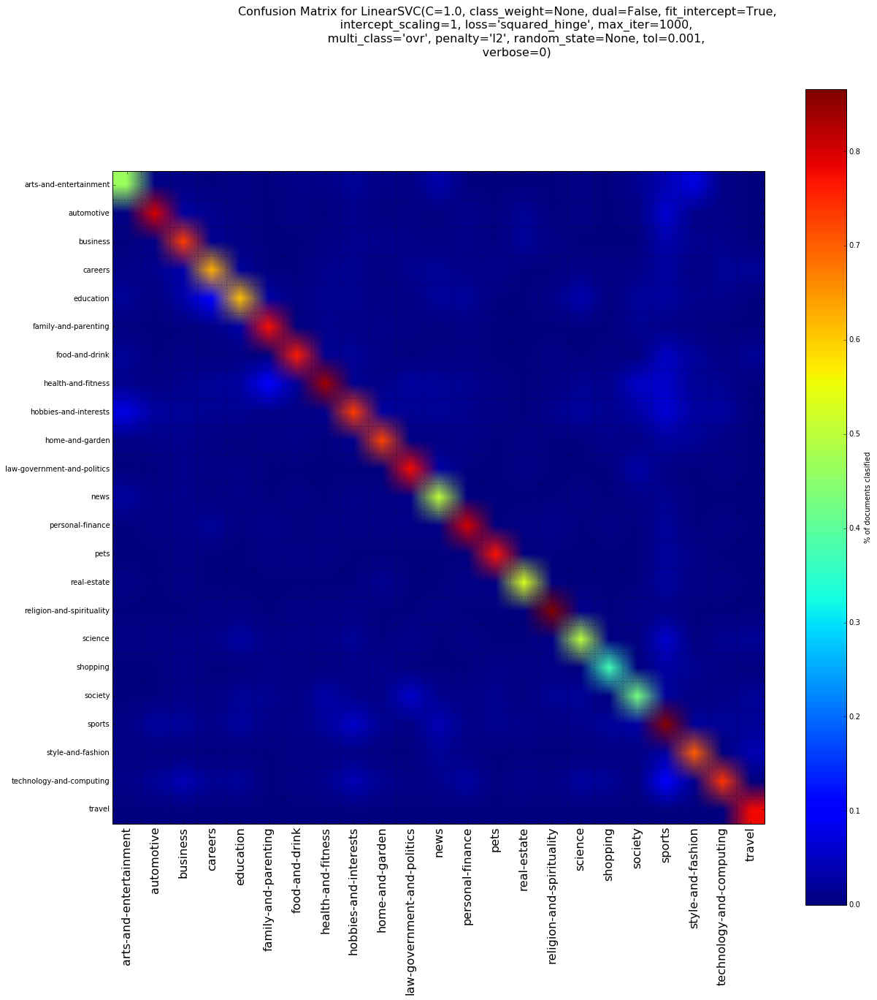

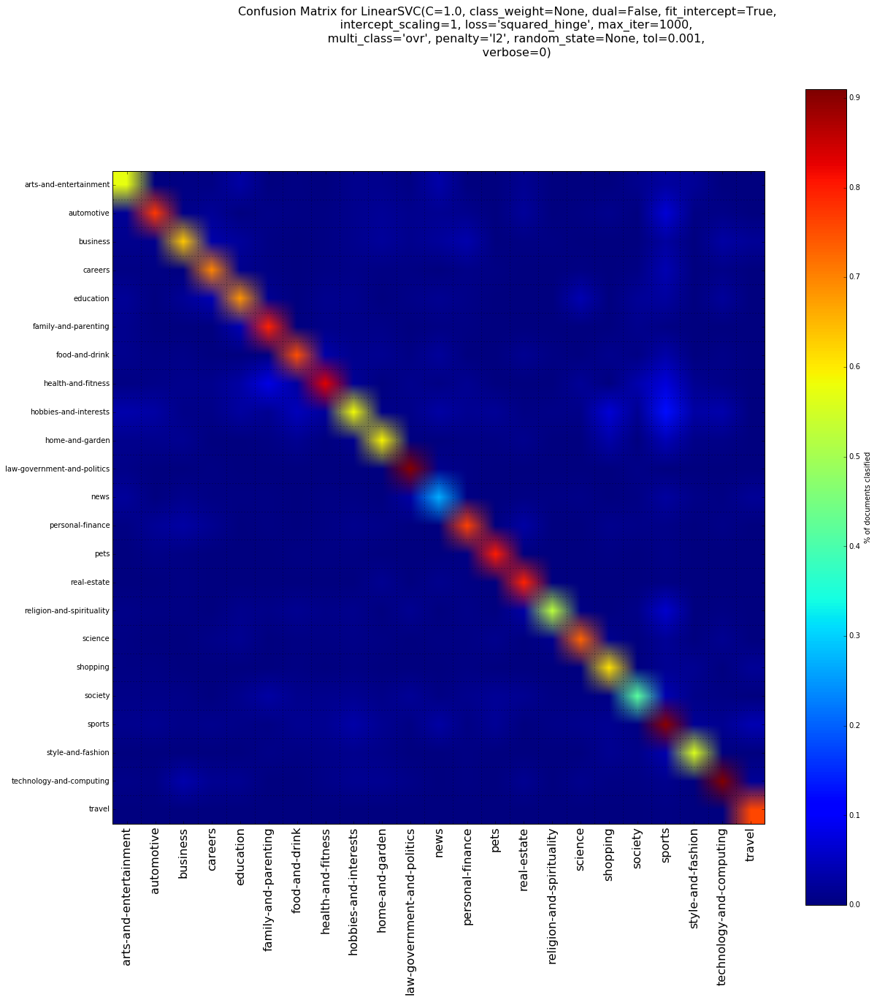

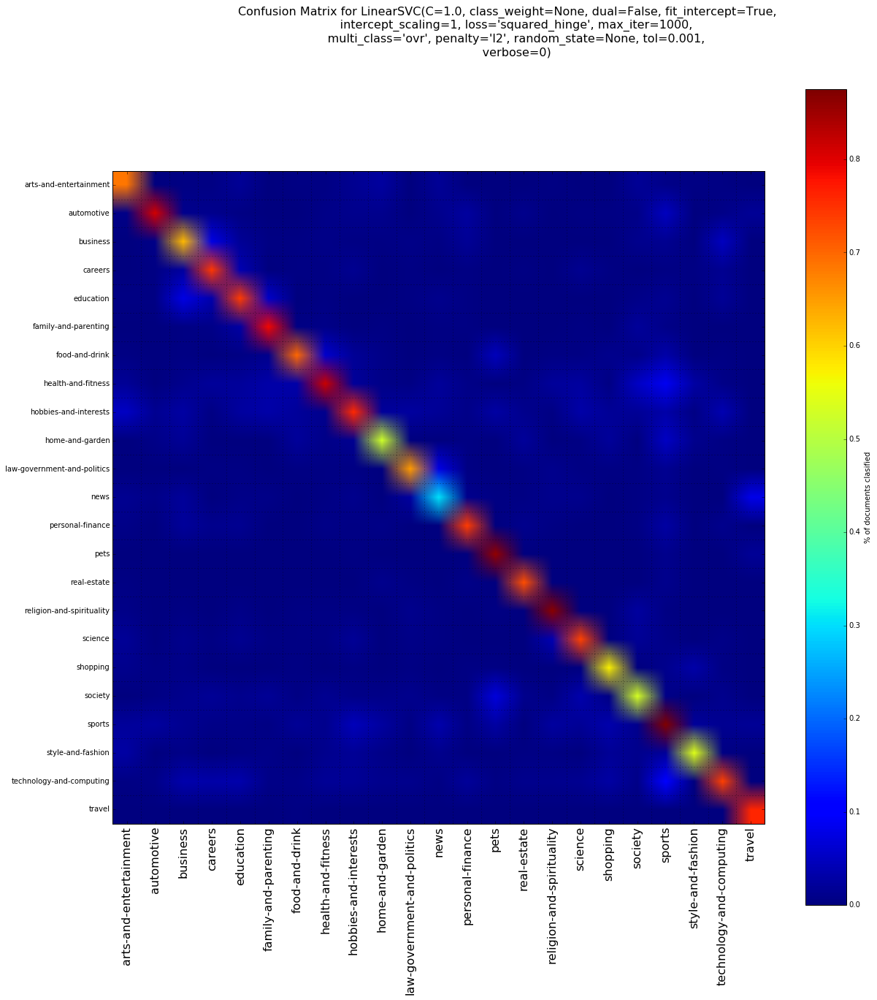

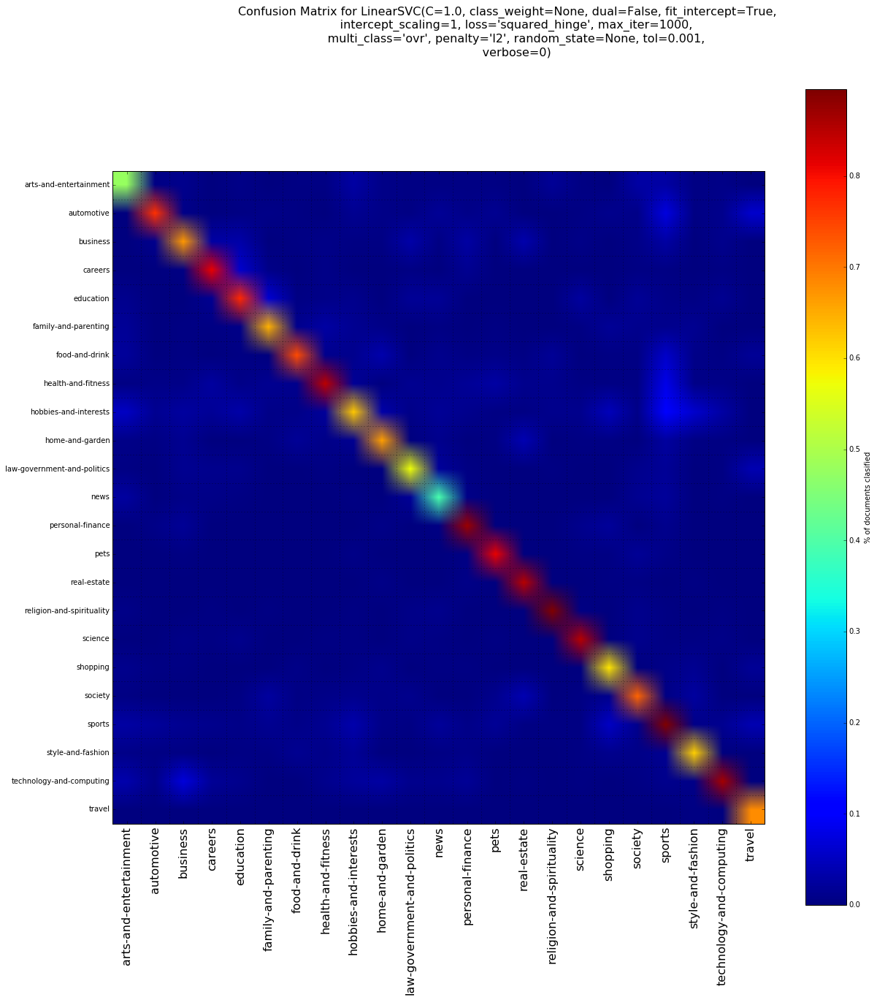

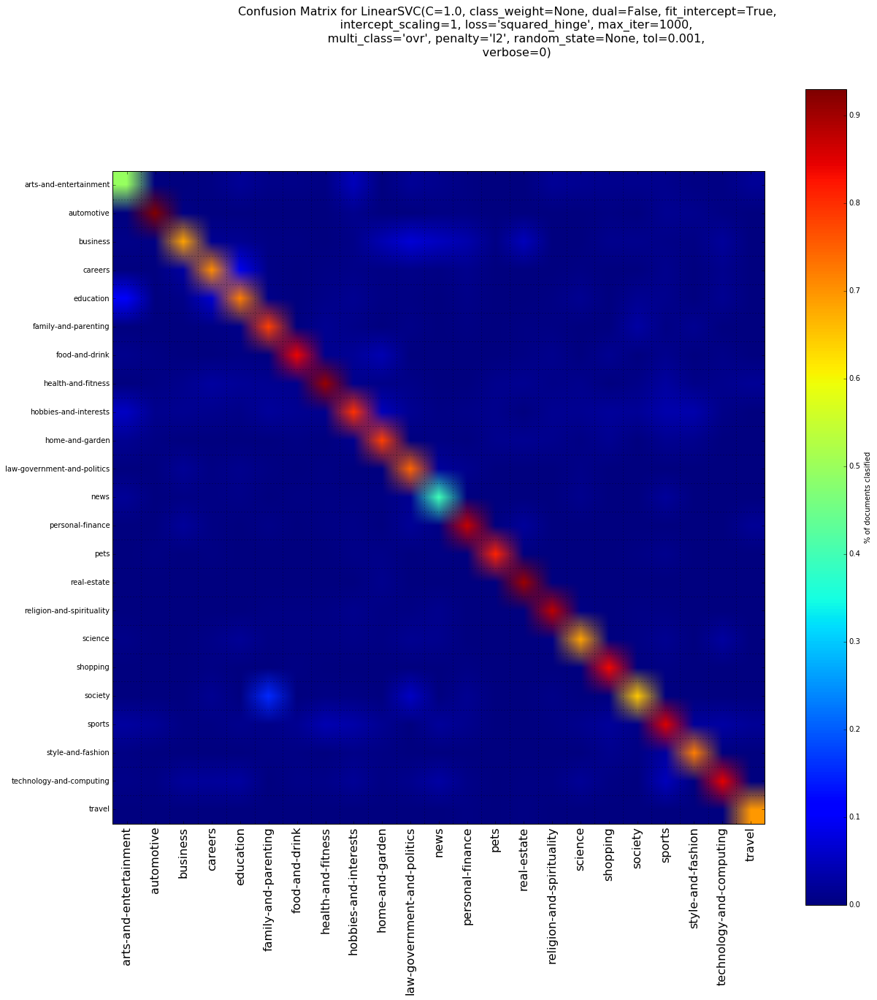

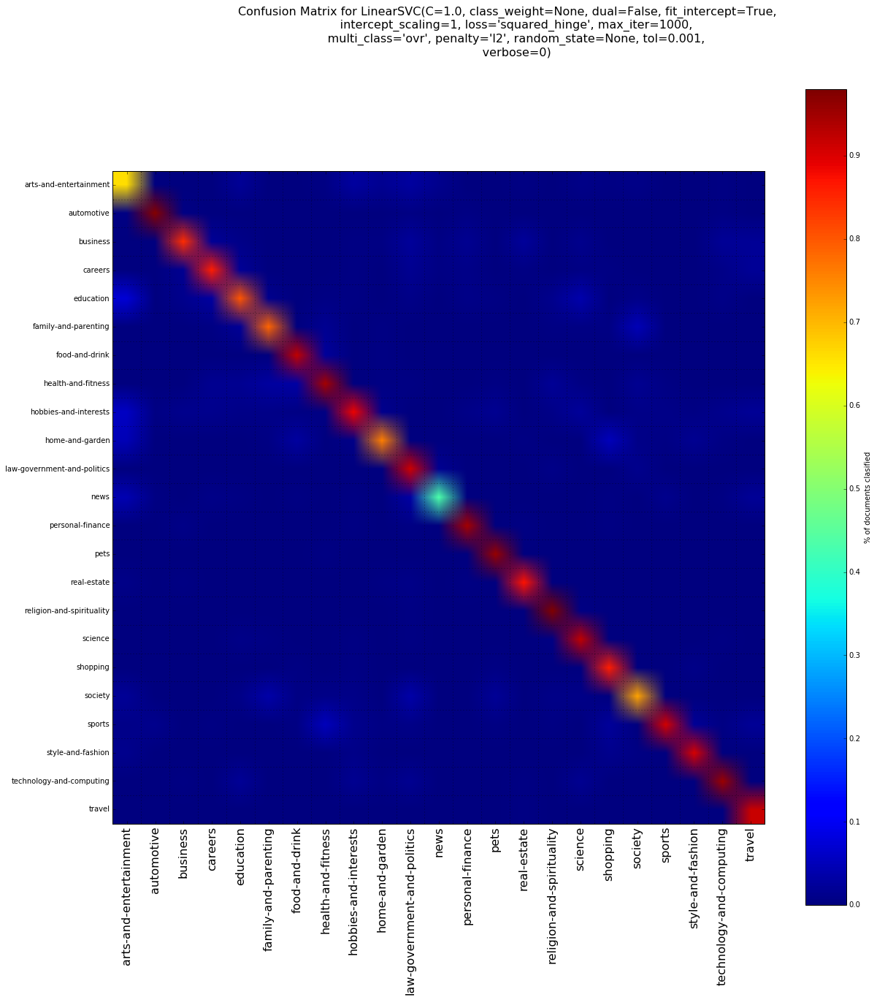

In [26]:
rLSV = KFS_Execution(kf, mydata.data, mydata.target, vectorizer, LinearSVC(loss='squared_hinge', penalty='l2', dual=False, tol=1e-3))

### Now for Naive Bayes

129370 14387
Extracting 50000 best features by a chi-squared test
done in 1.187081s
________________________________________________________________________________
Training: 
MultinomialNB(alpha=0.01, class_prior=None, fit_prior=True)
train time: 0.433s
test time:  0.034s
accuracy:   0.654
dimensionality: 50000
density: 1.000000
classification report:
                             precision    recall  f1-score   support

     arts-and-entertainment       0.76      0.57      0.65       326
                 automotive       0.82      0.64      0.72       994
                   business       0.48      0.36      0.41       571
                    careers       0.70      0.62      0.66       507
                  education       0.58      0.69      0.63       654
       family-and-parenting       0.84      0.69      0.76       411
             food-and-drink       0.81      0.78      0.79       814
         health-and-fitness       0.53      0.84      0.65      1904
      hobbies-and-inter

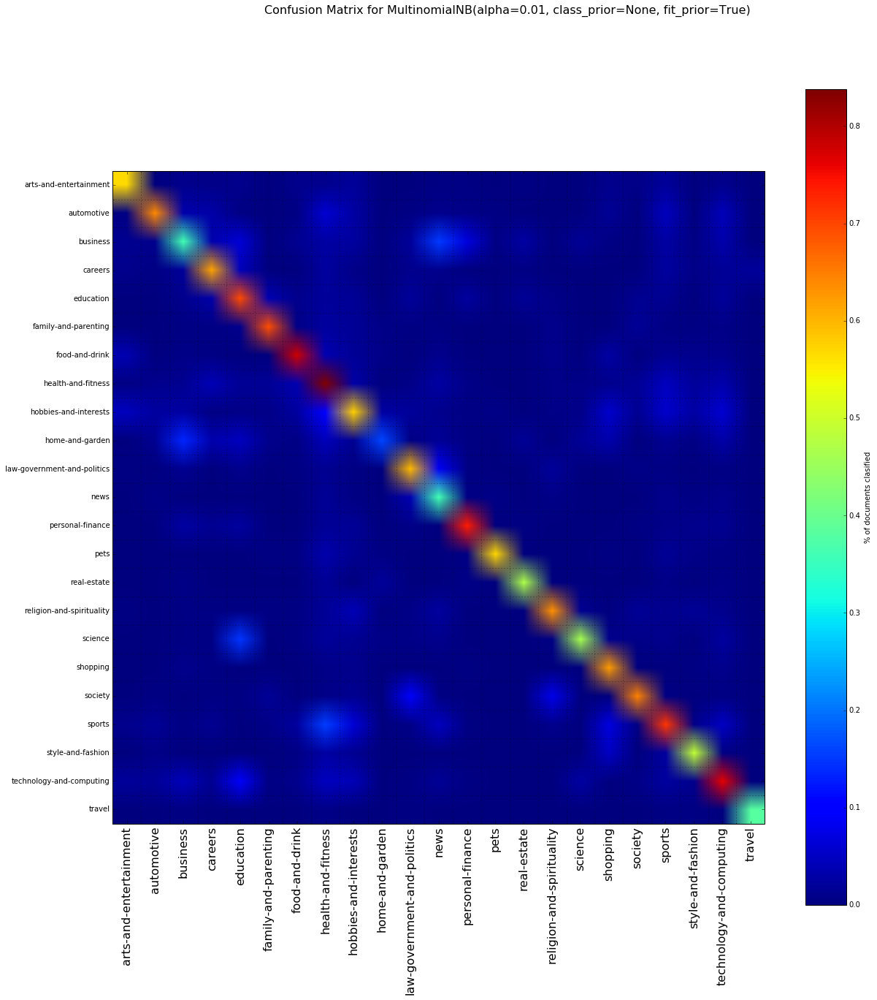

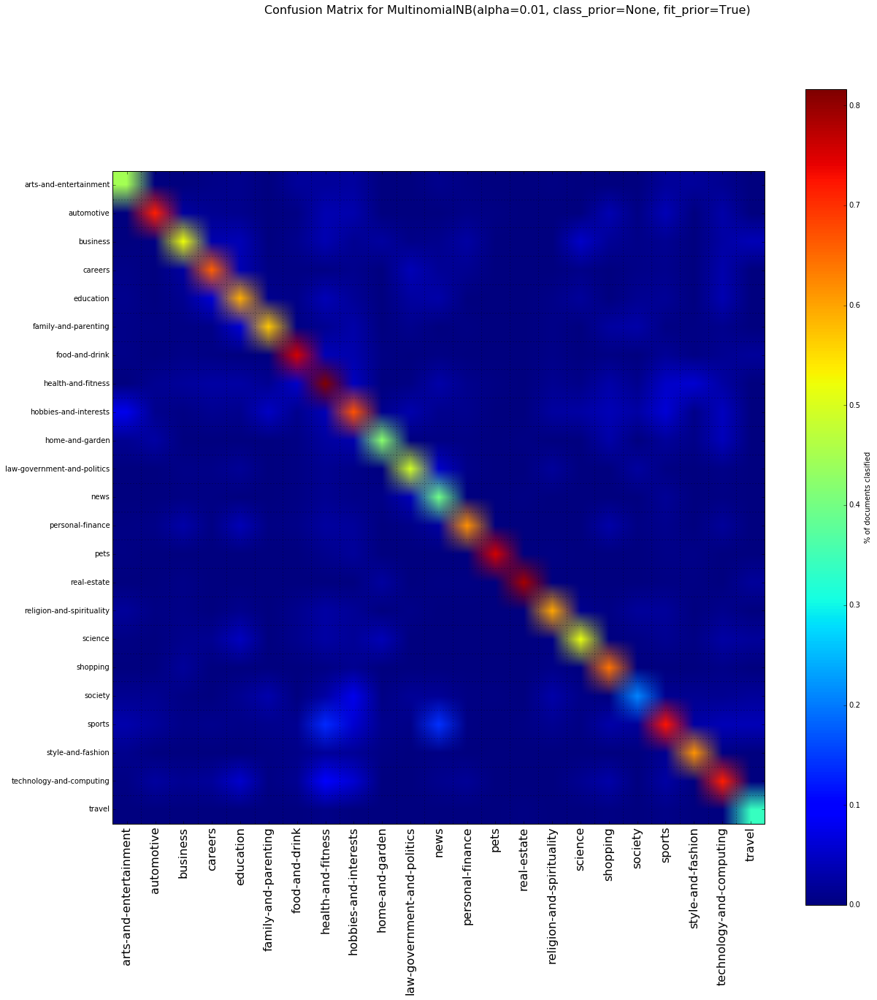

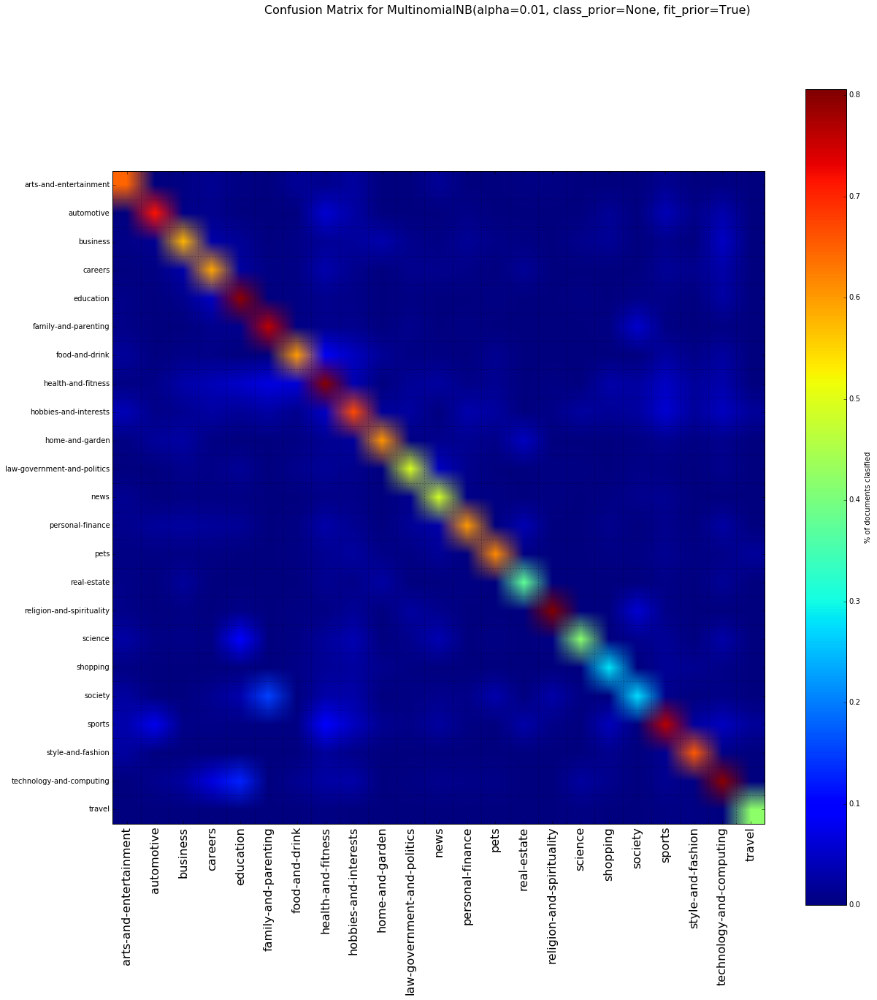

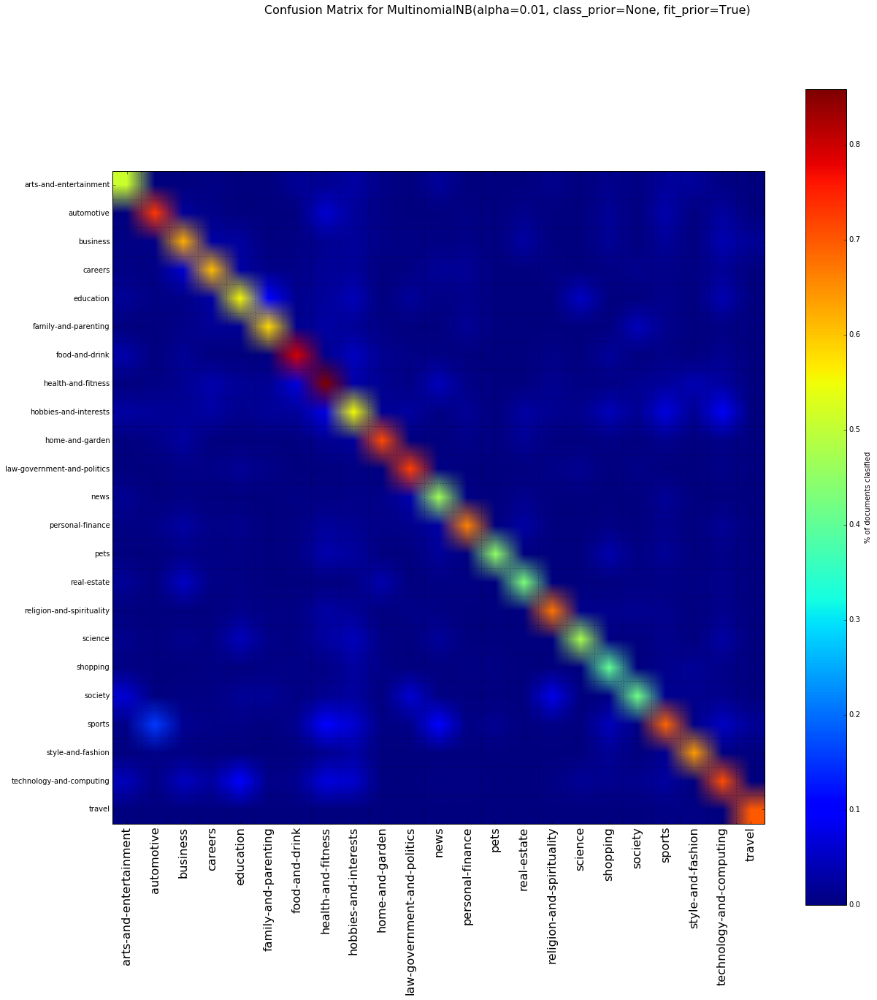

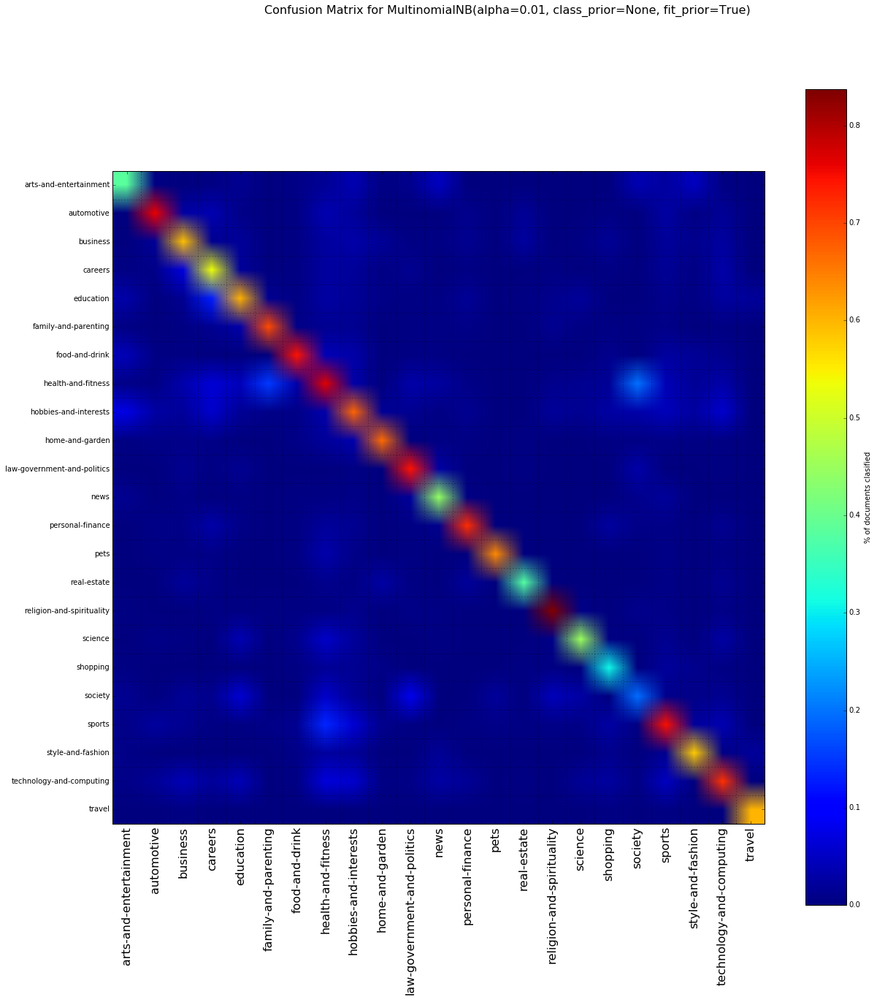

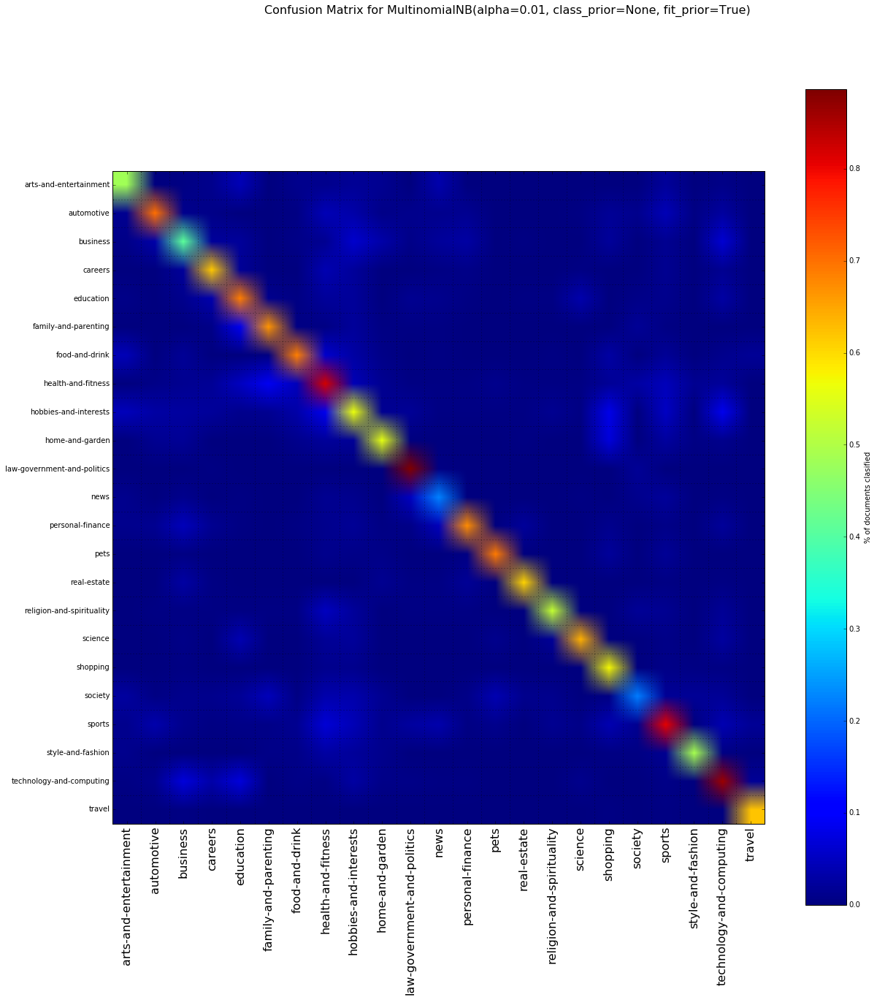

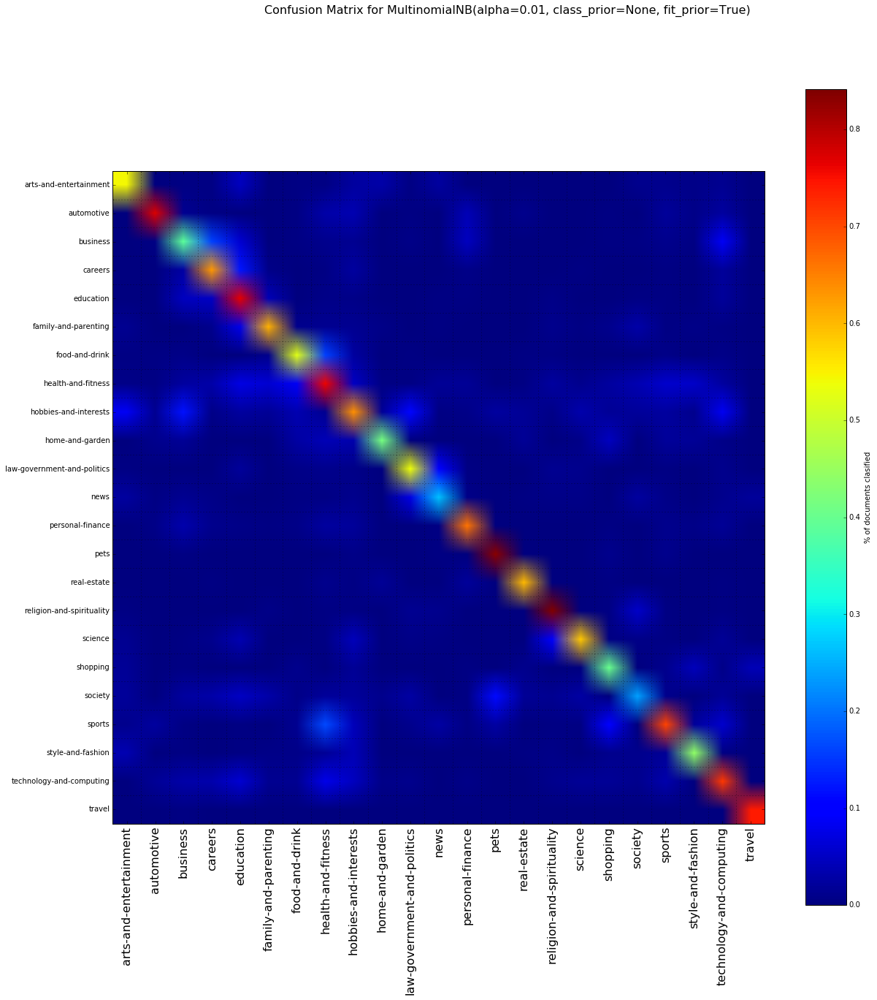

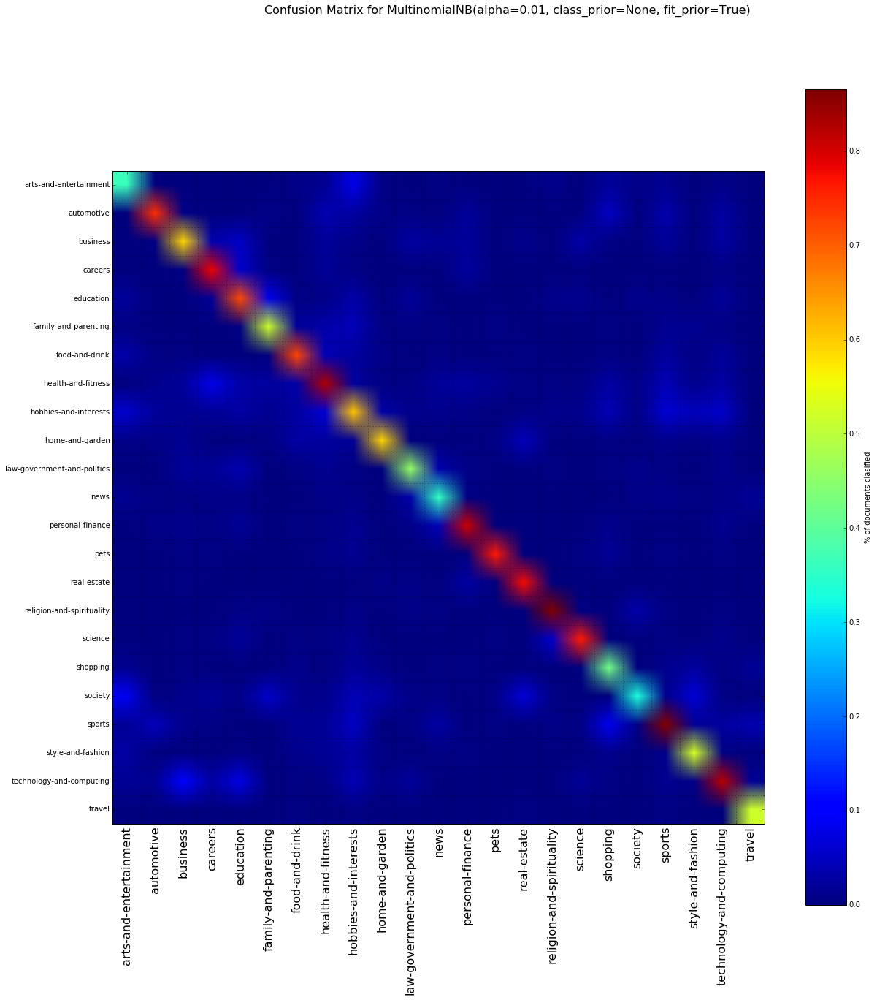

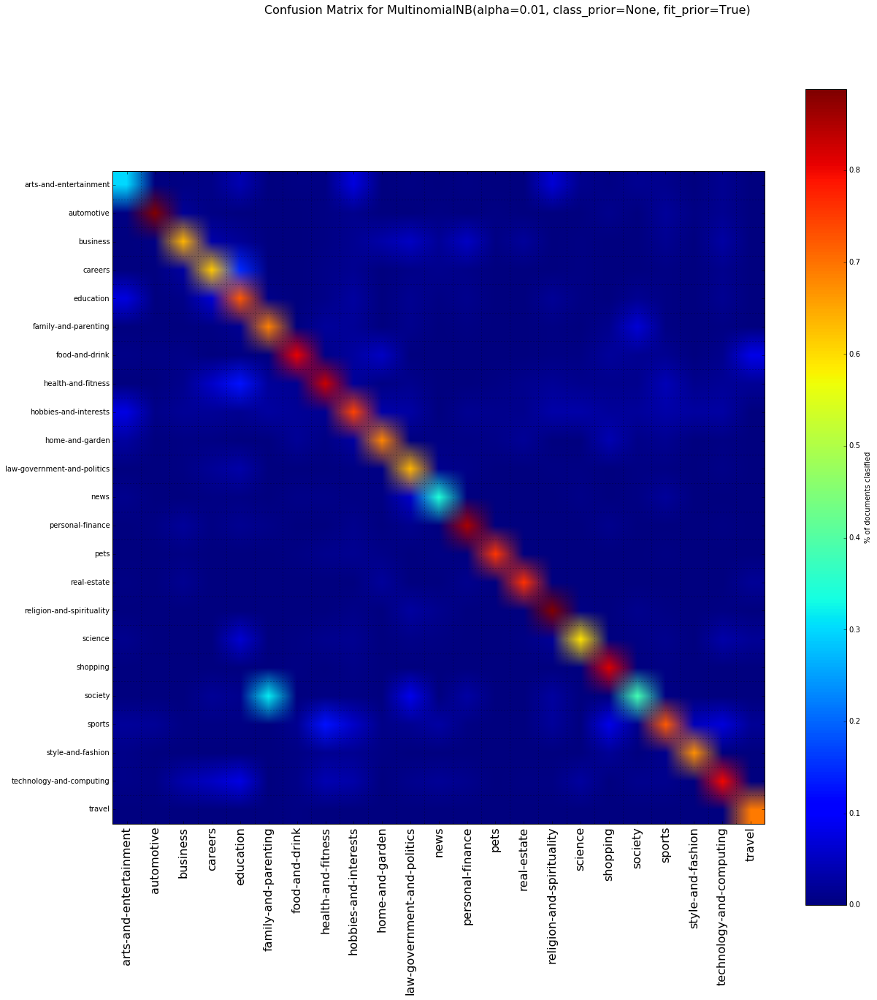

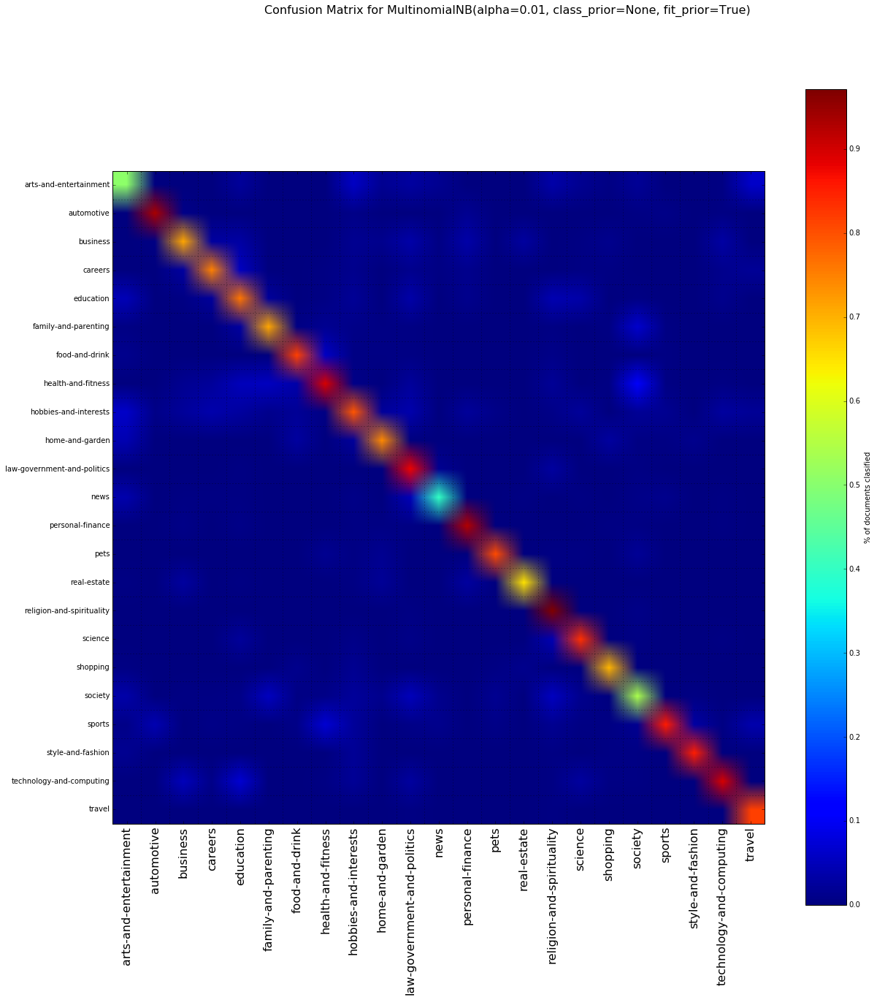

In [27]:
r = KFS_Execution(kf, mydata.data, mydata.target, vectorizer, MultinomialNB(alpha=.01))

In [28]:
#r = KFS_Execution(kf, mydata.data, mydata.target, vectorizer, MultinomialNB(alpha=.01))

In [29]:
r

[('MultinomialNB',
  0.6538541739069994,
  0.03414797782897949,
  array([[ 185,    0,    6,    4,    8,    0,    8,   24,   27,    0,    0,
             1,    2,    0,    1,    1,    0,    2,    3,   38,    0,   16,
             0],
         [   2,  635,   20,   15,    4,    0,    5,  115,   33,    0,    1,
             2,    5,    2,    0,    0,    0,    3,    0,   87,    0,   65,
             0],
         [   5,   13,  207,   17,   42,    1,   13,   50,   32,    1,    5,
            26,   37,    2,    5,    0,    8,    1,    0,   55,    1,   50,
             0],
         [   4,    5,   12,  313,   28,    0,    2,   47,    9,    0,    3,
             2,    1,    0,    1,    0,    1,    0,    1,   47,    2,   28,
             1],
         [   1,    1,    7,   15,  454,   15,    8,   39,   24,    0,    5,
             0,   13,    0,    3,    3,    1,    0,    5,   27,    0,   33,
             0],
         [   0,    0,    3,    2,    7,  284,    6,   44,   21,    4,    1,
             1,

### Now RF

129370 14387
Extracting 50000 best features by a chi-squared test
done in 1.289392s
________________________________________________________________________________
Training: 
RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=40, n_jobs=4,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)
train time: 309.202s
test time:  0.582s
accuracy:   0.675
classification report:
                             precision    recall  f1-score   support

     arts-and-entertainment       0.83      0.62      0.71       326
                 automotive       0.80      0.71      0.75       994
                   business       0.58      0.35      0.43       571
                    careers       0.75      0.67      0.70       507
                  education       0.65  

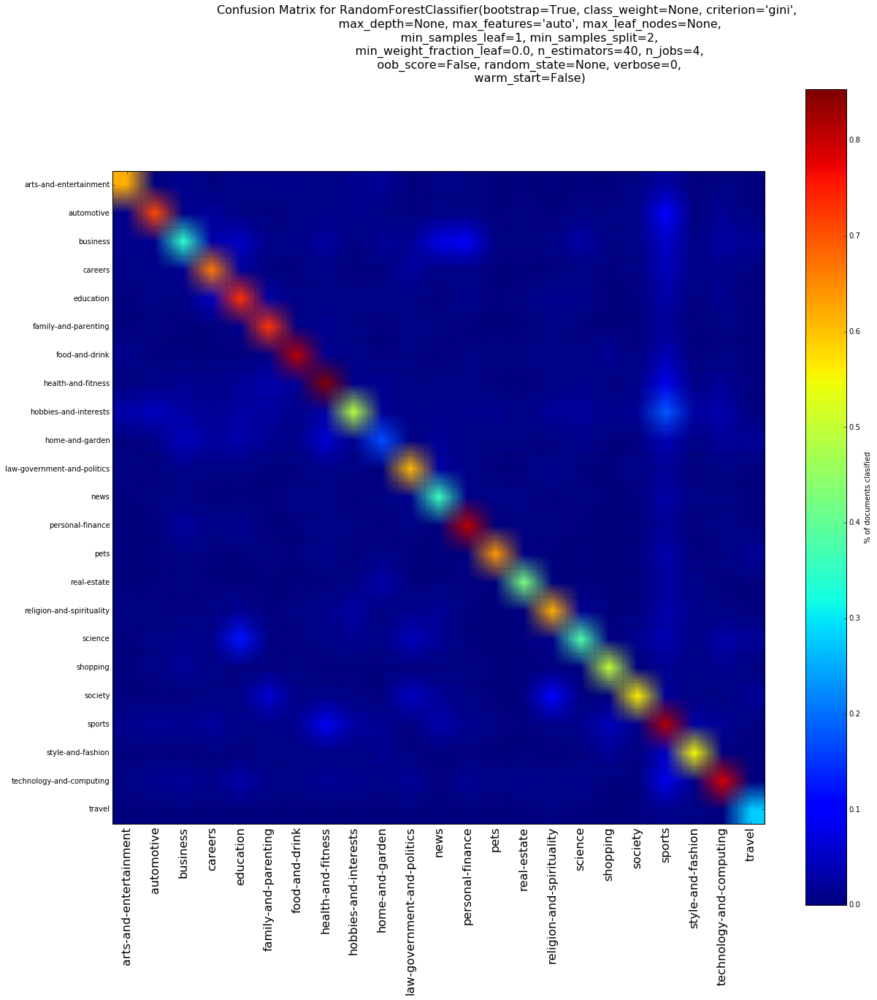

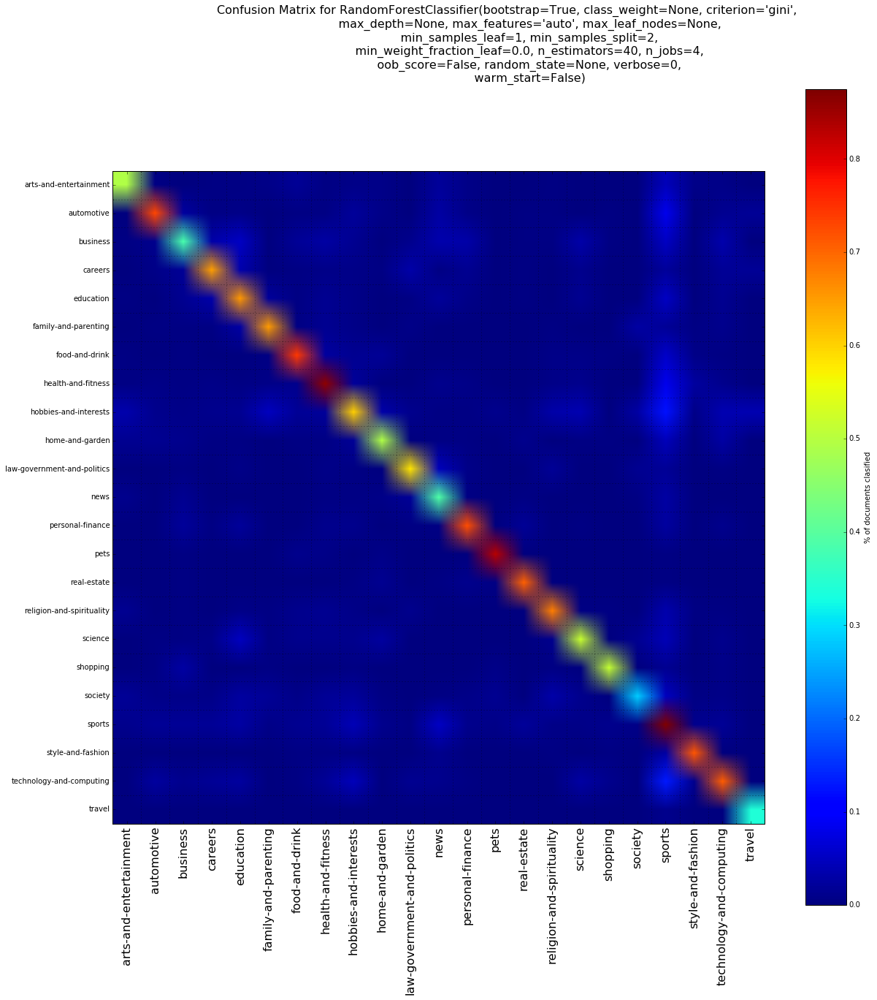

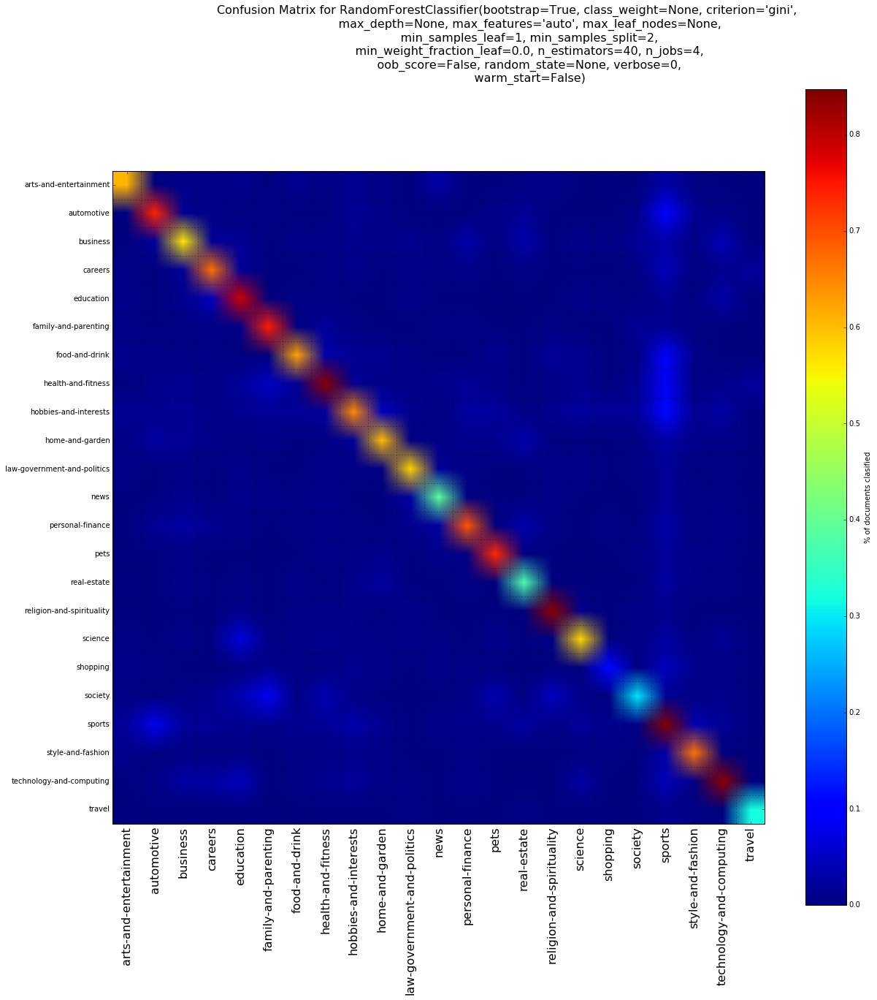

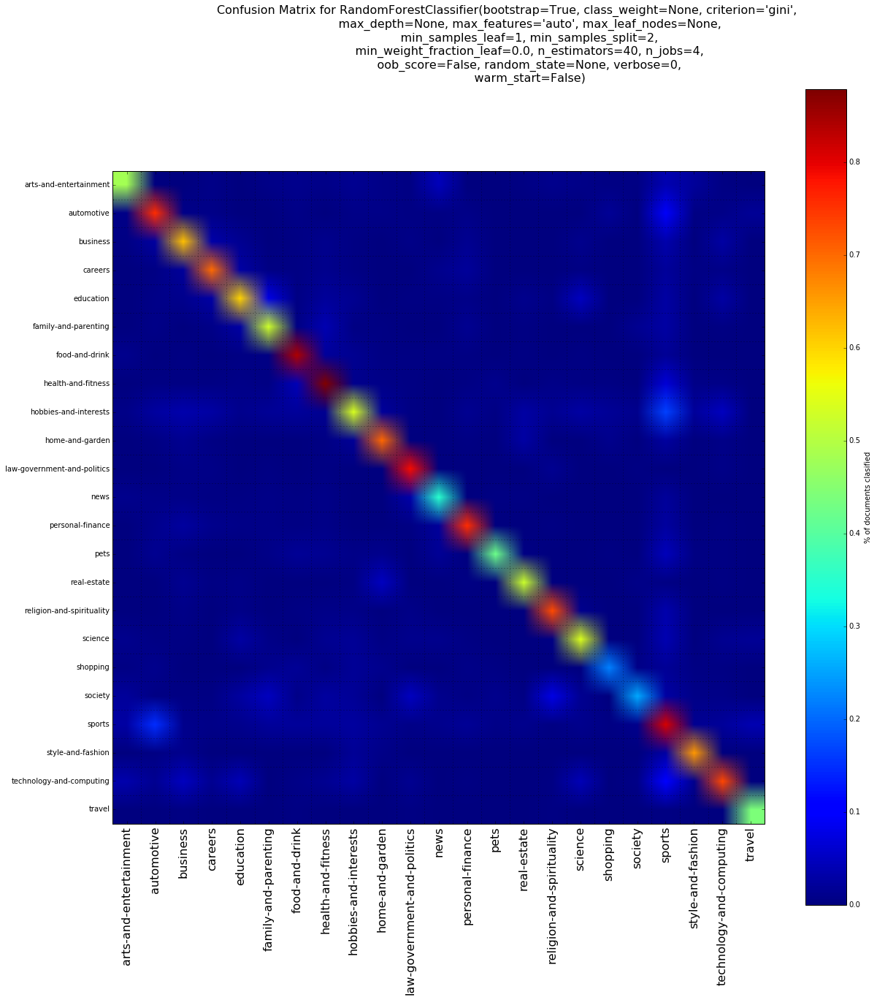

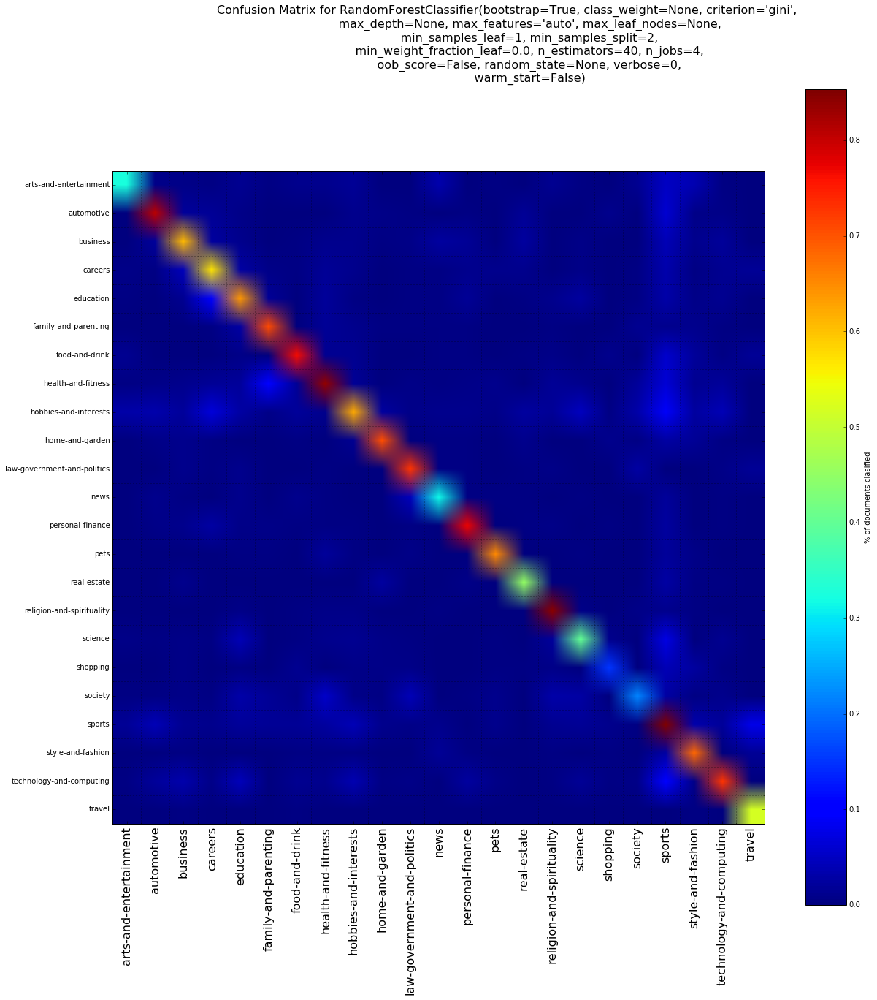

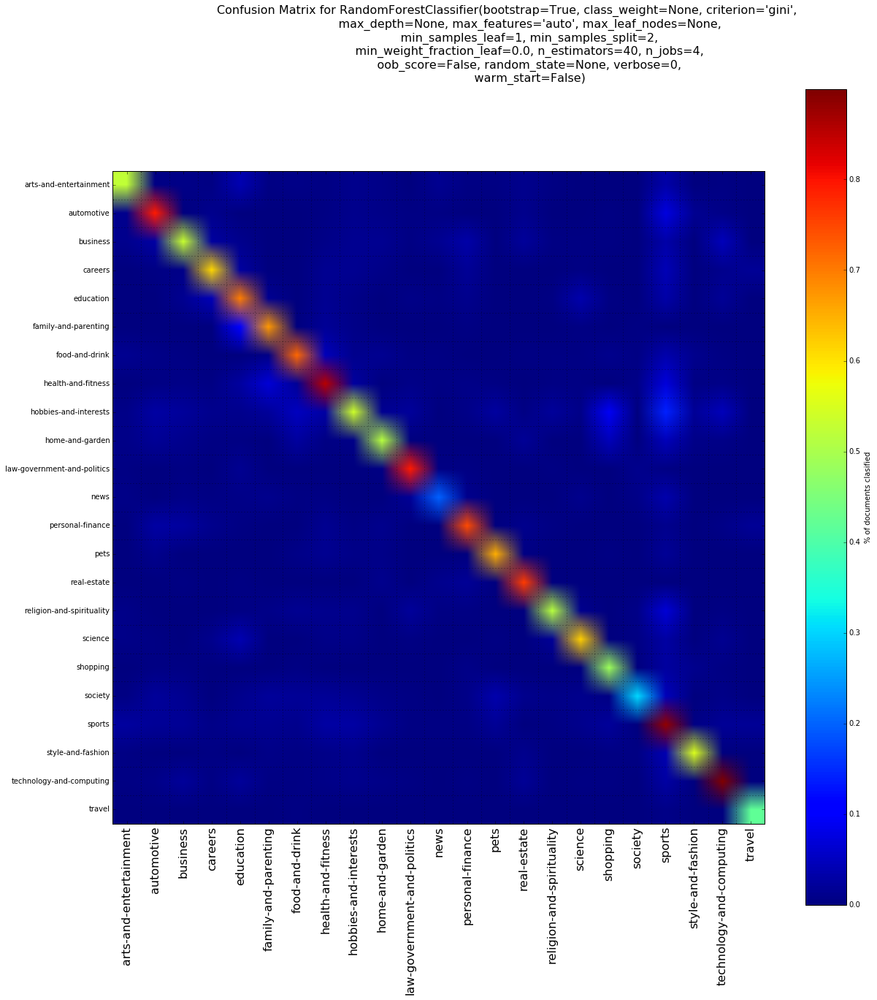

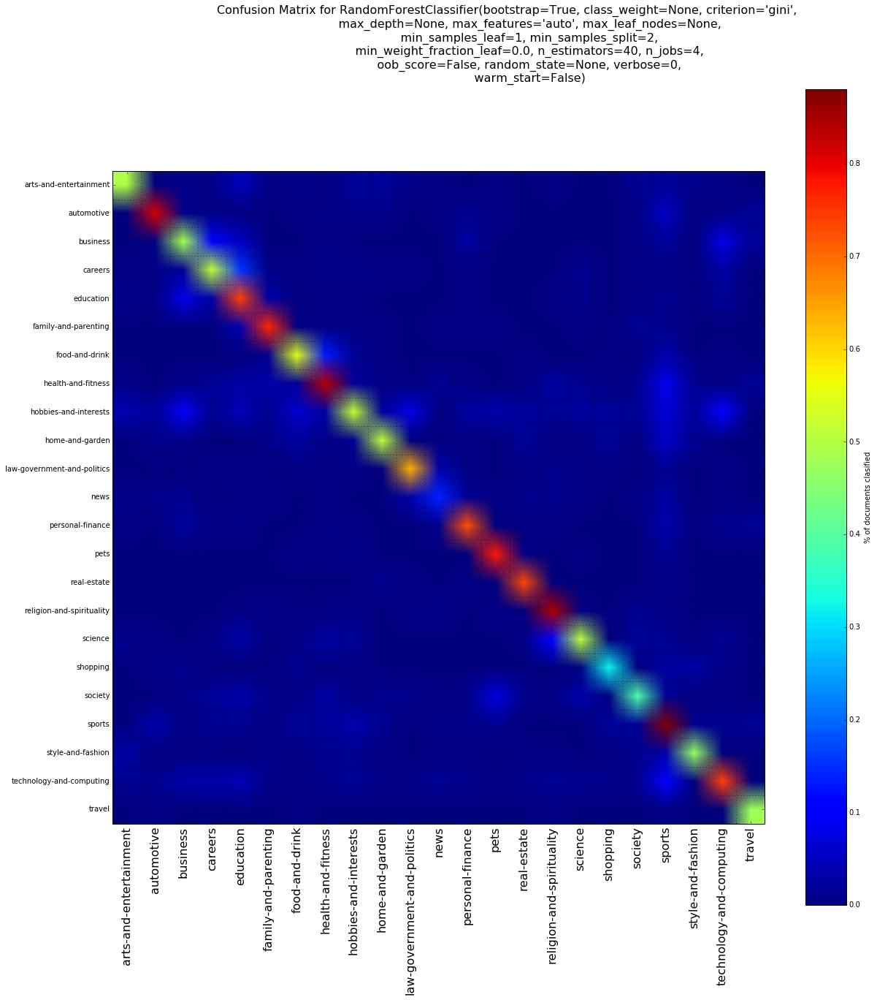

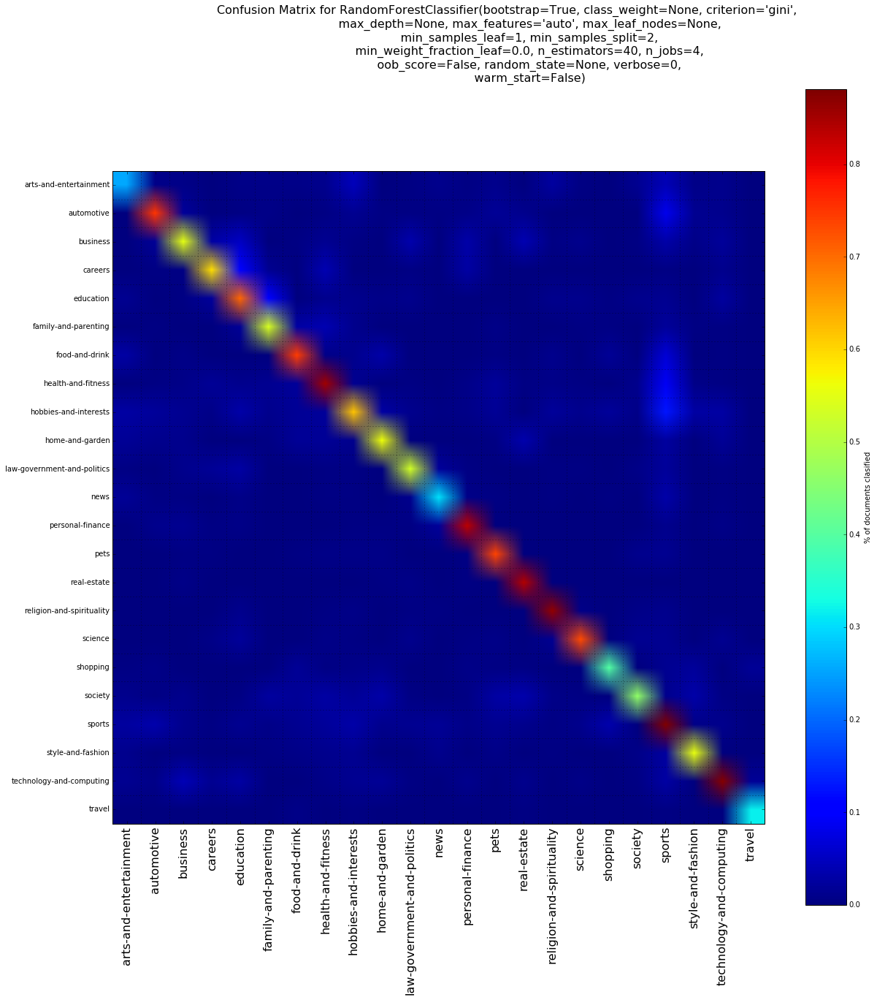

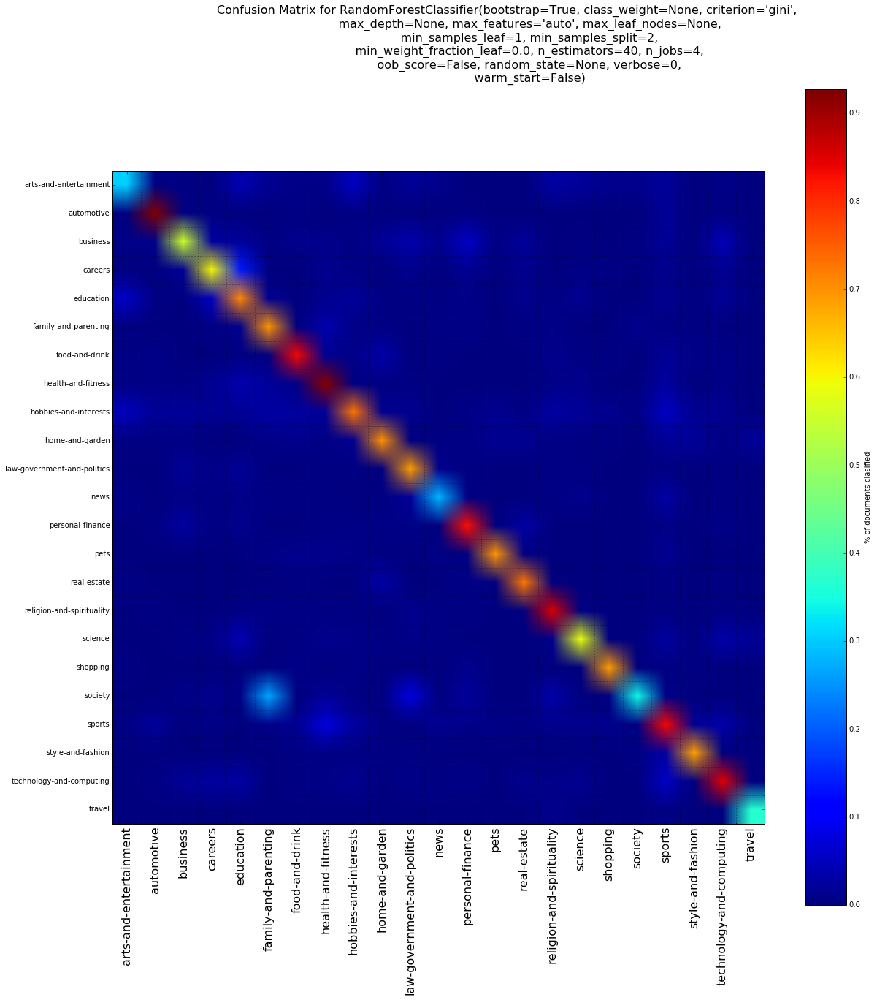

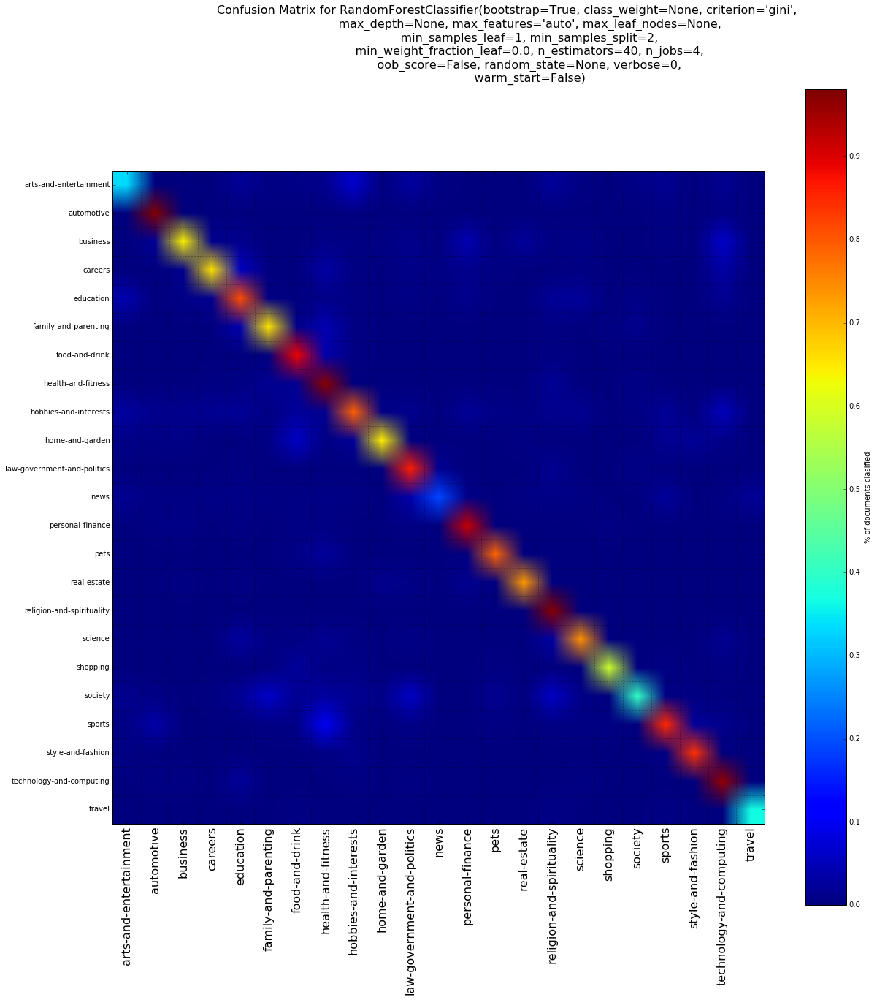

In [30]:
rRF = KFS_Execution(kf, mydata.data, mydata.target, vectorizer, RandomForestClassifier(n_estimators=40, n_jobs=4))

## Let's calculate the average scores and times

In [31]:
# Final Score definition
def finalScore(f1s, tts):
    if (f1s < 0.70) or tts>1:
        return 0
    else:
        return (1-tts)*0.3+0.7*f1s
    
# A very simple function to calculate the averages
def F1Score_TestT_from_result(r):
    # x[2] is the time. It's *2 because each execution has 14K documents and we are interesting
    #  in the time of 25K Documents. 
    ri = map(lambda x: (x[1], x[2]*2), r)
    ri2 = reduce(lambda x,y: (x[0]+y[0], x[1]+y[1] ), ri)
    return  np.array(ri2) / len(r)

def extract_all_execution_result(r):
    return map(lambda x: (x[1], x[2]*2), r)
        

In [32]:
# Naive Bayes results
nbs = F1Score_TestT_from_result(r)
print nbs, finalScore(nbs[0], nbs[1])

[ 0.69260817  0.09490442] 0


In [33]:
# Linear SVC results
lsvcs = F1Score_TestT_from_result(rLSV)
print lsvcs, finalScore(lsvcs[0], lsvcs[1])

[ 0.76174075  0.0877768 ] 0.806885480629


In [34]:
# Random Forest results
rfs = F1Score_TestT_from_result(rRF)
print rfs, finalScore(rfs[0], rfs[1])

[ 0.71661166  0.96446733] 0.512287962228


In [35]:
extract_all_execution_result(r)

[(0.6538541739069994, 0.06829595565795898),
 (0.65792950010428974, 0.07993412017822266),
 (0.6794158553546592, 0.08802175521850586),
 (0.66314251930166235, 0.07440614700317383),
 (0.66780274048827992, 0.07293987274169922),
 (0.67844719632670103, 0.07606220245361328),
 (0.64681324798218753, 0.07757806777954102),
 (0.72056777066518229, 0.08586597442626953),
 (0.73693367666504284, 0.13452386856079102),
 (0.82117499651956005, 0.19141626358032227)]

In [36]:
extract_all_execution_result(rLSV)

[(0.71050253701258081, 0.06738805770874023),
 (0.72745602447333657, 0.06302404403686523),
 (0.7427677329624478, 0.07117795944213867),
 (0.7244209501286778, 0.07150602340698242),
 (0.73958405787020931, 0.06673240661621094),
 (0.74509531097815496, 0.07463598251342773),
 (0.74958252156971894, 0.0751638412475586),
 (0.77400500974116337, 0.0876760482788086),
 (0.81070359802352288, 0.10276365280151367),
 (0.89328971181957395, 0.19770002365112305)]

In [37]:
extract_all_execution_result(rRF)

[(0.67505386807534584, 1.1640138626098633),
 (0.69081554613084895, 0.9500761032104492),
 (0.71168289290681497, 0.9170522689819336),
 (0.69033873548028102, 0.9908261299133301),
 (0.69673784516936776, 0.9470744132995605),
 (0.71072770279671627, 1.0396580696105957),
 (0.68480378513776785, 1.0079021453857422),
 (0.72488171444475369, 0.7259340286254883),
 (0.76115248103556266, 1.1464481353759766),
 (0.81992203814562159, 0.7556881904602051)]